In [1]:
from collections import defaultdict
import itertools
import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import ihop
from ihop.community2vec import GensimCommunity2Vec
import ihop.clustering as ic

#sns.set_palette("Dark2")

# For poster
import matplotlib
font_dir = ['/Users/virginia/Library/Fonts/']
for font in matplotlib.font_manager.findSystemFonts(font_dir):
    matplotlib.font_manager.fontManager.addfont(font)
sns.set_theme(context="poster", palette="Greys", font="Roboto")



In [21]:

DATA_ROOT = Path("../data")
C2V_ROOT = DATA_ROOT / "community2vec"
STABILITY_METRICS_ROOT = DATA_ROOT / "cluster_stability"
VIZ_PATH = DATA_ROOT / "paper_visuals"

MONTHS = sorted(["2021-04", "2021-05", "2021-06", "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-12", "2022-01", "2022-02", "2022-03"
])

C2V_MODELS = [GensimCommunity2Vec.load(C2V_ROOT / f"RC_{m}"/"best_model") for m in MONTHS]

SUBREDDIT_COUNTS_CSVS = [C2V_ROOT / f"RC_{m}" / "subreddit_counts.csv" for m in MONTHS]

# Random seeds for KMeans cluster experiments
RANDOM_SEEDS = [7, 17, 29, 32, 42, 53, 63, 70, 84, 96]

# Clustering size for generating these results
#NUM_CLUSTERS = [5, 10, 50, 100, 175, 250, 400]
NUM_CLUSTERS = [100]

# Set up for Hierarchical agglomerative clustering
LINKAGE_TYPES = ["complete", "average", "ward"]

# How will clusterings be compared? These are the keys for different comparison metrics calculated by ihop.clustering
SYMMETRIC_METRICS = [
    "intersection_comment_probability_variation_of_information",
    "intersection_uniform_probability_variation_of_information", 
    "union_uniform_probability_variation_of_information", 
    #"intersection_uniform_probability_normalized_mutual_info", 
    #"union_uniform_probability_normalized_mutual_info", 
    "intersection_uniform_probability_v_measure", 
    "union_uniform_probability_v_measure", 
    "intersection_uniform_probability_adjusted_rand_index", 
    "union_uniform_probability_adjusted_rand_index"
    ]

ASYMMETRIC_METRICS = [
    #"intersection_uniform_probability_homogeneity",
    "union_uniform_probability_homogeneity",
    #"intersection_uniform_probability_completeness",
    "union_uniform_probability_completeness"
    ]

ALL_CLUSTER_COMP_METRICS = SYMMETRIC_METRICS + ASYMMETRIC_METRICS

# Easy to read titles for metrics in plots
VIZ_TITLES = {
    "intersection_comment_probability_variation_of_information" : "VI with subreddit intersection\nand comment probability",
    "intersection_uniform_probability_variation_of_information": "VI with subreddit intersection", 
    "union_uniform_probability_variation_of_information": "VI\nwith subreddit union",
    "intersection_uniform_probability_normalized_mutual_info": "NMI with subreddit intersection", 
    "union_uniform_probability_normalized_mutual_info": "NMI with subreddit union",
    "intersection_uniform_probability_v_measure": "V-Measure with subreddit intersection",
    "union_uniform_probability_v_measure": "V-Measure with subreddit union",
    "intersection_uniform_probability_adjusted_rand_index": "ARI with subreddit intersection", 
    "union_uniform_probability_adjusted_rand_index": "ARI with subreddit union",
    "intersection_uniform_probability_homogeneity": "Homogeneity with subreddit intersection",
    "union_uniform_probability_homogeneity": "Homogeneity with subreddit union",
    "intersection_uniform_probability_completeness": "Completeness with subreddit intersection",
    "union_uniform_probability_completeness": "Completeness with subreddit union"
}


# Basic Comparison of Top Most Popular Subreddits Month-to-Month

In order to build the community2vec models, we kept the top 10K subreddits in each month by number of comments posted. Since the top subreddits will change over time, we need to know quickly and by how much. This can be determined using the [Jaccard Index](https://en.wikipedia.org/wiki/Jaccard_index) of the top subreddits between each month. Let $S_1$ and $S_2$ be the top 10K subreddits for months 1 and 2 respectively, then the similarity and diversity of top subreddits between those months is $\frac{|S_1 \cap S_2|}{|S_1 \cup S_2|}$.

In [3]:
C2V_N_NEAREST_NEIGHBORS = 20
# Jaccard index for subreddits in community2vec models for each month in our year's worth of Reddit data
records = []
for i, model in enumerate(C2V_MODELS):
    month_label = MONTHS[i]
    print("Processing month:", month_label)
    current_model_keys = set(model.get_index_to_key())
    
    # Build up union and intersection values both for overall top subreddits and 
    # nearest neighbors under c2v models
    for j, model2 in enumerate(C2V_MODELS):
        month2_label = MONTHS[j]
        current_model2_keys = set(model2.get_index_to_key())
        union = current_model_keys.union(current_model2_keys)
        union_size = len(union)
        intersection_size = len(current_model_keys.intersection(current_model2_keys))

        rolling_sum_c2v_jaccard = 0

        # Check how much overlap there is between the nearest neighbors in the 
        # community2vec models
        for w in current_model_keys:
            nn_intersection_size = 0
            nn_union_size = C2V_N_NEAREST_NEIGHBORS
            model1_nearest_neighbors = set(model.get_nearest_neighbors(w, topn=C2V_N_NEAREST_NEIGHBORS))
            if w in model2.w2v_model.wv:
                model2_nearest_neighbors = set(model2.get_nearest_neighbors(w, topn=C2V_N_NEAREST_NEIGHBORS))
                nn_intersection_size = len(model1_nearest_neighbors.intersection(model2_nearest_neighbors))
                nn_union_size = len(model1_nearest_neighbors.union(model2_nearest_neighbors))
            subreddit_ji_index = nn_intersection_size / nn_union_size
            rolling_sum_c2v_jaccard += subreddit_ji_index

        
        c2v_nn_jaccard_avg = rolling_sum_c2v_jaccard / len(current_model_keys)
    
        records.append((month_label, month2_label, union_size, intersection_size, c2v_nn_jaccard_avg))
    
top_subreddit_ji_dataframe = pd.DataFrame.from_records(records, 
        columns = [
            "Month 1", 
            "Month 2", 
            "Union Size", 
            "Intersection Size", 
            f"Community2vec Top {C2V_N_NEAREST_NEIGHBORS} Nearest Subreddit Neighbors Jaccard Index"])
top_subreddit_ji_dataframe["Jaccard Index"] = top_subreddit_ji_dataframe["Intersection Size"] / top_subreddit_ji_dataframe["Union Size"]

display(top_subreddit_ji_dataframe)

Processing month: 2021-04
Processing month: 2021-05
Processing month: 2021-06
Processing month: 2021-07
Processing month: 2021-08
Processing month: 2021-09
Processing month: 2021-10
Processing month: 2021-11
Processing month: 2021-12
Processing month: 2022-01
Processing month: 2022-02
Processing month: 2022-03


,Month 1,Month 2,Union Size,Intersection Size,Community2vec Top 20 Nearest Subreddit Neighbors Jaccard Index,Jaccard Index
0,2021-04,2021-04,10000,10000,1.000000,1.000000
1,2021-04,2021-05,10790,9210,0.385764,0.853568
2,2021-04,2021-06,11110,8890,0.351074,0.800180
3,2021-04,2021-07,11334,8666,0.333619,0.764602
4,2021-04,2021-08,11438,8562,0.323280,0.748557
...,...,...,...,...,...,...
139,2022-03,2021-11,11470,8530,0.332889,0.743679
140,2022-03,2021-12,11332,8668,0.341910,0.764914
141,2022-03,2022-01,11175,8825,0.358931,0.789709
142,2022-03,2022-02,10729,9271,0.392935,0.864107


Text(0.5, 1.0, 'Jaccard Similarity between the Top Subreddits 10K for each Month')

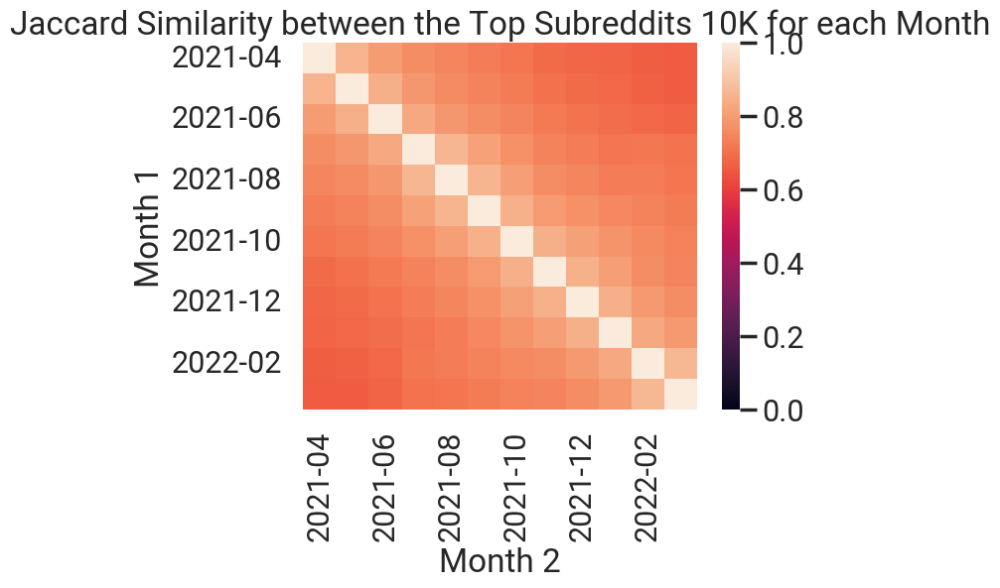

In [4]:
# Switch comments for gray
sns.heatmap(top_subreddit_ji_dataframe.pivot(index = "Month 1", columns = "Month 2", values = "Jaccard Index"), vmin=0, vmax=1).set_title("Jaccard Similarity between the Top Subreddits 10K for each Month")
#sns.heatmap(top_subreddit_ji_dataframe.pivot(index = "Month 1", columns = "Month 2", values = "Jaccard Index"), vmin=0, vmax=1, cmap="gray").set_title("Jaccard Similarity between the Top Subreddits 10K for each Month")

Text(0.5, 1.0, 'Average Jaccard Similarity between the Top 20 Nearest Subreddits in the Community2vec Model for each Month')

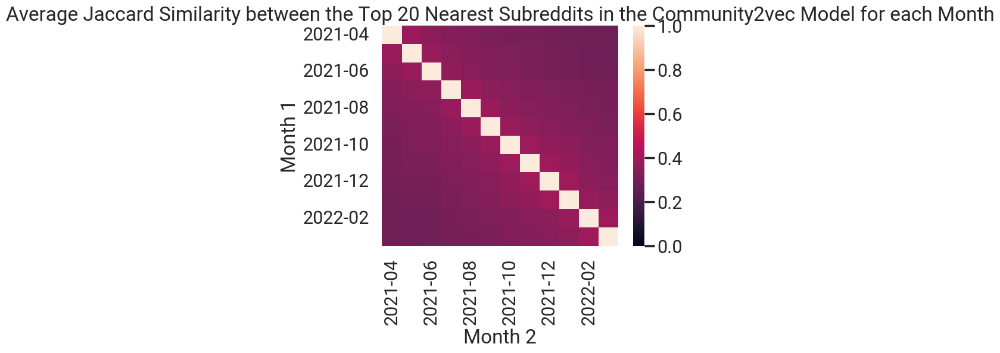

In [5]:
# Switch comments for gray
#sns.heatmap(top_subreddit_ji_dataframe.pivot(index = "Month 1", columns = "Month 2", values = f"Community2vec Top {C2V_N_NEAREST_NEIGHBORS} Nearest Subreddit Neighbors Jaccard Index"), vmin=0, vmax=1, cmap="gray").set_title(f"Average Jaccard Similarity between the Top {C2V_N_NEAREST_NEIGHBORS} Nearest Subreddits in the Community2vec Model for each Month")
sns.heatmap(top_subreddit_ji_dataframe.pivot(index = "Month 1", columns = "Month 2", values = f"Community2vec Top {C2V_N_NEAREST_NEIGHBORS} Nearest Subreddit Neighbors Jaccard Index"), vmin=0, vmax=1).set_title(f"Average Jaccard Similarity between the Top {C2V_N_NEAREST_NEIGHBORS} Nearest Subreddits in the Community2vec Model for each Month")

The closer to 1 the values are, the more similar the top subreddits are between those two months. This plot shows that months closer in time have more top subreddits in common that months further apart in time. 

# Month-to-month K-means Cluster Stability Comparison
We'd like to measure how much variation there is between the k-means clusters of subreddits based on the community2vec embeddings created from each month of Reddit comment data. 

Here, we use a single community2vec model for each month (don't vary the community2vec models). Each month's community2vec model is used to train 10 k-means models where the random seed for the cluster model is varied, then the inter- and intra-month stability for each cluster model is measured. We also vary the number of clusters allowed for each. For each number of clusters, make the same number of comparisons each month. 

The intra-month values (training multiple k-means models from same community2vec model for a single month) will tell us how sensitive the k-means clusters are to random initialization within the same time range and community2vec model. We expect these values to be low relative to inter-month values. If they are high, it's an indication that the clusterings are sensitive to random initializations and indicates they may be difficult to use for research purposes. 

The inter-month values (training multiple k-means models for two separate months and doing many pairwise comparisons) will tell us how much the clusterings change over time. In most cases, we expect these values to be low when comparing two months that are close together in time, but higher for months that are far apart. In other words, these metrics should give an indication of how much Reddit clusterings change as time goes on. However, there's the possibility for these values to be high when drastic changes occur on Reddit, such as when certain subreddits spike in popularity or are banned. In such cases, the inter-month stability metrics could serve as an indicator of large changes in Reddit's "geography". 

In [6]:
# Num_clusters -> List of lists, where nested lists store paths to kmeans models for each month
metrics_collection = []
kmeans_models = defaultdict(list)
for month, c2v_model in zip(MONTHS, C2V_MODELS):
    print("Training clustering models for month:", month)
    vectors = c2v_model.w2v_model.wv
    data = c2v_model.get_normed_vectors()
    index = dict(enumerate(vectors.index_to_key))
    # Month path
    kmeans_month_path = STABILITY_METRICS_ROOT / f"{month}"
    kmeans_month_path.mkdir(parents=True, exist_ok=True)
    for n_clusters in NUM_CLUSTERS:
        kmeans_num_clusters_path = kmeans_month_path / f"{month}_numClusters{n_clusters}"
        current_month_batch_paths = []
        for i, seed in enumerate(RANDOM_SEEDS):
            this_kmeans_path = kmeans_num_clusters_path / f"{i}"
            current_month_batch_paths.append(this_kmeans_path)
            if not this_kmeans_path.exists():
                name = f"{month} KMeans model {n_clusters} clusters with random seed {seed}"
                #print("\tTraining", name)
                kmeans_model = ic.ClusteringModelFactory.init_clustering_model(model_choice = "kmeans", data=data, index=index, model_name=name, n_clusters=n_clusters, random_state = seed)
                kmeans_model.train()
                #print("\tSaving", name)
                kmeans_model.save(this_kmeans_path)
                metrics = kmeans_model.write_metrics((this_kmeans_path / "metrics.json"))
            else: 
                with (this_kmeans_path / "metrics.json").open(mode='r') as metrics_json:
                    metrics = json.load(metrics_json)

            metrics.update({"random_seed": seed, "experiment_id": i, "month": month, "n_clusters": n_clusters, "path": str(this_kmeans_path)})
            metrics_collection.append(metrics)
        kmeans_models[n_clusters].append(current_month_batch_paths)

kmeans_metrics_df = pd.DataFrame.from_records(metrics_collection)


Training clustering models for month: 2021-04
Training clustering models for month: 2021-05
Training clustering models for month: 2021-06
Training clustering models for month: 2021-07
Training clustering models for month: 2021-08
Training clustering models for month: 2021-09
Training clustering models for month: 2021-10
Training clustering models for month: 2021-11
Training clustering models for month: 2021-12
Training clustering models for month: 2022-01
Training clustering models for month: 2022-02
Training clustering models for month: 2022-03


In [7]:
display(kmeans_metrics_df)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,random_seed,experiment_id,month,n_clusters,path
0,0.102059,54.498023,3.077911,7,0,2021-04,100,../data/cluster_stability/2021-04/2021-04_numC...
1,0.099089,54.747398,3.140232,17,1,2021-04,100,../data/cluster_stability/2021-04/2021-04_numC...
2,0.098346,54.551313,3.143314,29,2,2021-04,100,../data/cluster_stability/2021-04/2021-04_numC...
3,0.105911,54.531143,3.082920,32,3,2021-04,100,../data/cluster_stability/2021-04/2021-04_numC...
4,0.103841,54.811491,3.087060,42,4,2021-04,100,../data/cluster_stability/2021-04/2021-04_numC...
...,...,...,...,...,...,...,...,...
115,0.100469,55.823018,3.078728,53,5,2022-03,100,../data/cluster_stability/2022-03/2022-03_numC...
116,0.100529,55.895251,3.056993,63,6,2022-03,100,../data/cluster_stability/2022-03/2022-03_numC...
117,0.099570,55.968599,3.079239,70,7,2022-03,100,../data/cluster_stability/2022-03/2022-03_numC...
118,0.099790,55.922089,3.067835,84,8,2022-03,100,../data/cluster_stability/2022-03/2022-03_numC...


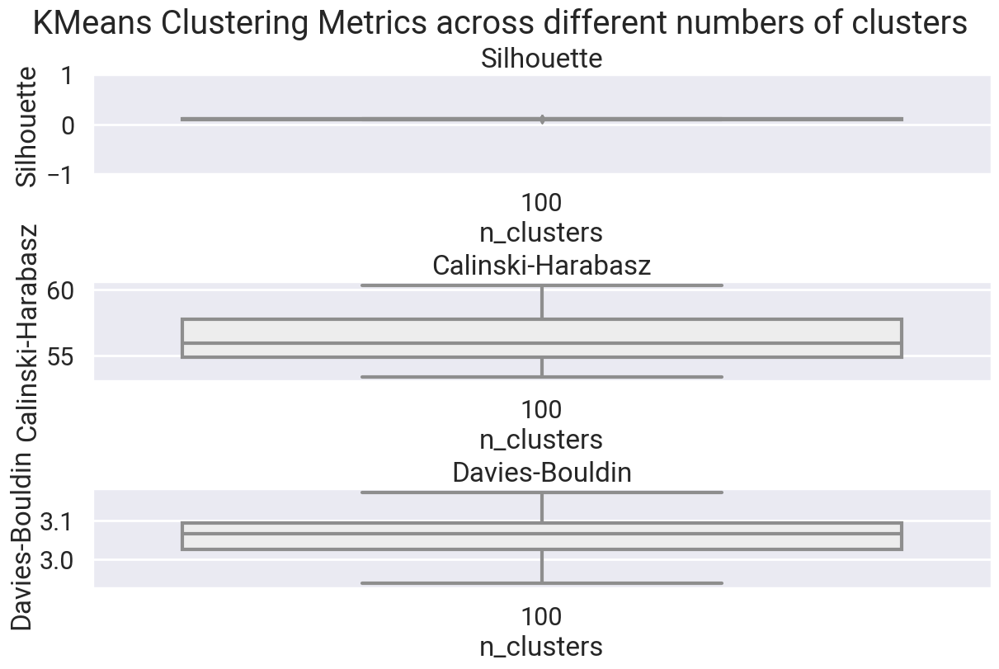

In [8]:
fig, axes = plt.subplots(ncols = 1, nrows=3, figsize=(12,8), constrained_layout=True)
fig.suptitle(f"KMeans Clustering Metrics across different numbers of clusters")
for i, metric_key in enumerate(["Silhouette", "Calinski-Harabasz", "Davies-Bouldin"]):
    if metric_key=="Silhouette":
        axes[i].set(ylim=(-1, 1))
    sns.boxplot(ax = axes[i], x="n_clusters", y=metric_key, order=NUM_CLUSTERS, data=kmeans_metrics_df)
    axes[i].set_title(metric_key)

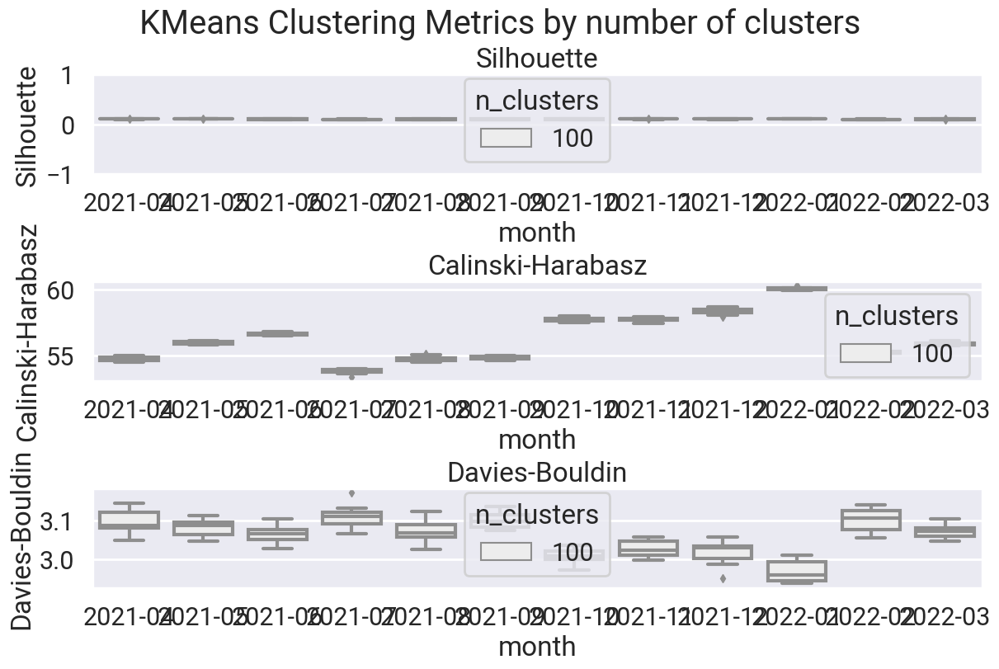

<Figure size 640x480 with 0 Axes>

In [9]:

fig, axes = plt.subplots(ncols = 1, nrows=3, figsize=(12,8), constrained_layout=True)
fig.suptitle(f"KMeans Clustering Metrics by number of clusters")
for i, metric_key in enumerate(["Silhouette", "Calinski-Harabasz", "Davies-Bouldin"]):
    if metric_key=="Silhouette":
        axes[i].set(ylim=(-1, 1))
    sns.boxplot(ax = axes[i], x="month", y=metric_key, order=MONTHS, data=kmeans_metrics_df, hue="n_clusters")
    axes[i].set_title(metric_key)
plt.show()
plt.clf()

In [10]:
# Actually computes the metrics that measure stability across time
# Pairwise comparison between KMeans cluster assignments of subreddits
all_comparison_results = []
comp_counter = 0
for n_clusters in NUM_CLUSTERS:
    print("Num clusters", n_clusters)
    # Compare month by month, experiment number i gets compared to all other experiments 
    # numbered i+1 or greater over all months
    for i1, month1 in enumerate(MONTHS):
        # Read in experiment 1 data
        month1_counts_dict = pd.read_csv(SUBREDDIT_COUNTS_CSVS[i1]).to_dict("records")
        month1_counts = {d["subreddit"]: d["count"] for d in month1_counts_dict}

        for exp_id1, seed in enumerate(RANDOM_SEEDS): 
            current_kmeans_path = STABILITY_METRICS_ROOT / f"{month1}" / f"{month1}_numClusters{n_clusters}" / str(exp_id1)
            current_kmeans_model = ic.ClusteringModel.load(current_kmeans_path, 
                C2V_MODELS[i1].get_normed_vectors(),
                C2V_MODELS[i1].get_index_as_dict(),
            )
            current_model_assignments = current_kmeans_model.get_cluster_assignments_as_dict()

            # Read in experiment 2 data
            for i2, month2 in enumerate(MONTHS):
                month2_counts_dict = pd.read_csv(SUBREDDIT_COUNTS_CSVS[i2]).to_dict("records")
                month2_counts = {d["subreddit"]: d["count"] for d in month2_counts_dict}

                # VI is symmetric, so index experiments so that you don't repeat comparisons or compare a model to itself
                for exp_id2 in range(exp_id1 + 1, len(RANDOM_SEEDS)):
                    kmeans_comparison_path = STABILITY_METRICS_ROOT / f"{month2}" / f"{month2}_numClusters{n_clusters}" / str(exp_id2)
                    kmeans_comparison_model = ic.ClusteringModel.load(
                        kmeans_comparison_path, 
                        C2V_MODELS[i2].get_normed_vectors(),
                        C2V_MODELS[i2].get_index_as_dict()
                        )
                    comparison_model_assignments = kmeans_comparison_model.get_cluster_assignments_as_dict()

                    # Compare the experiments and collect results
                    comparison_results = {"n_clusters":n_clusters, "month1": month1, "month1_experiment_id": exp_id1, "month2":month2, "month2_experiment_id":exp_id2 }
                    intersection_comparison_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=False,
                    cluster_1_counts = month1_counts, 
                    cluster_2_counts = month2_counts)
                    comparison_results.update(intersection_comparison_results)

                    intersection_uniform_prob_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=False)
                    comparison_results.update(intersection_uniform_prob_results)

                    union_comparison_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=True,
                    cluster_1_counts = month1_counts, 
                    cluster_2_counts = month2_counts)
                    comparison_results.update(union_comparison_results)

                    all_comparison_results.append(comparison_results)
                    comp_counter+=1

cluster_comparison_df = pd.DataFrame.from_records(all_comparison_results)
display(cluster_comparison_df)


Num clusters 100


/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator KMeans from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator KMeans from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator KMeans from version 1.0.1 when 

,n_clusters,month1,month1_experiment_id,month2,month2_experiment_id,intersection_comment_probability_variation_of_information,intersection_uniform_probability_adjusted_rand_index,intersection_uniform_probability_rand_index,intersection_uniform_probability_normalized_mutual_info,intersection_uniform_probability_homogeneity,intersection_uniform_probability_completeness,intersection_uniform_probability_v_measure,intersection_uniform_probability_variation_of_information,union_uniform_probability_adjusted_rand_index,union_uniform_probability_rand_index,union_uniform_probability_normalized_mutual_info,union_uniform_probability_homogeneity,union_uniform_probability_completeness,union_uniform_probability_v_measure,union_uniform_probability_variation_of_information
0,100,2021-04,0,2021-04,1,2.295443,0.552522,0.989599,0.791565,0.791833,0.791298,0.791565,2.703845,0.552522,0.989599,0.791565,0.791833,0.791298,0.791565,2.703845
1,100,2021-04,0,2021-04,2,2.124403,0.573216,0.990061,0.802826,0.802918,0.802733,0.802826,2.552837,0.573216,0.990061,0.802826,0.802918,0.802733,0.802826,2.552837
2,100,2021-04,0,2021-04,3,2.242683,0.576330,0.989823,0.795944,0.794389,0.797506,0.795944,2.637162,0.576330,0.989823,0.795944,0.794389,0.797506,0.795944,2.637162
3,100,2021-04,0,2021-04,4,2.162557,0.595701,0.990416,0.805103,0.804837,0.805370,0.805103,2.525124,0.595701,0.990416,0.805103,0.804837,0.805370,0.805103,2.525124
4,100,2021-04,0,2021-04,5,2.235574,0.578812,0.990273,0.802525,0.803721,0.801331,0.802525,2.561044,0.578812,0.990273,0.802525,0.803721,0.801331,0.802525,2.561044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6475,100,2022-03,8,2021-11,9,2.340920,0.529873,0.988959,0.770833,0.771544,0.770123,0.770833,2.969483,0.138640,0.957204,0.616374,0.616401,0.616347,0.616374,4.690651
6476,100,2022-03,8,2021-12,9,2.470647,0.522780,0.988552,0.768442,0.767696,0.769190,0.768442,2.996529,0.161231,0.961919,0.624543,0.624196,0.624890,0.624543,4.620322
6477,100,2022-03,8,2022-01,9,2.321625,0.503368,0.988397,0.764599,0.763924,0.765275,0.764599,3.042858,0.185002,0.967206,0.636881,0.636633,0.637130,0.636881,4.496231
6478,100,2022-03,8,2022-02,9,2.295290,0.524313,0.988735,0.770281,0.769452,0.771112,0.770281,2.964900,0.315793,0.979808,0.681414,0.681065,0.681763,0.681414,4.024069


In [11]:
cluster_comparison_df.to_csv(STABILITY_METRICS_ROOT / "cluster_comparison_metrics.csv", index=False)

In [12]:
cluster_comparison_df = pd.read_csv(STABILITY_METRICS_ROOT / "cluster_comparison_metrics.csv")
display(cluster_comparison_df)

,n_clusters,month1,month1_experiment_id,month2,month2_experiment_id,intersection_comment_probability_variation_of_information,intersection_uniform_probability_adjusted_rand_index,intersection_uniform_probability_rand_index,intersection_uniform_probability_normalized_mutual_info,intersection_uniform_probability_homogeneity,intersection_uniform_probability_completeness,intersection_uniform_probability_v_measure,intersection_uniform_probability_variation_of_information,union_uniform_probability_adjusted_rand_index,union_uniform_probability_rand_index,union_uniform_probability_normalized_mutual_info,union_uniform_probability_homogeneity,union_uniform_probability_completeness,union_uniform_probability_v_measure,union_uniform_probability_variation_of_information
0,100,2021-04,0,2021-04,1,2.295443,0.552522,0.989599,0.791565,0.791833,0.791298,0.791565,2.703845,0.552522,0.989599,0.791565,0.791833,0.791298,0.791565,2.703845
1,100,2021-04,0,2021-04,2,2.124403,0.573216,0.990061,0.802826,0.802918,0.802733,0.802826,2.552837,0.573216,0.990061,0.802826,0.802918,0.802733,0.802826,2.552837
2,100,2021-04,0,2021-04,3,2.242683,0.576330,0.989823,0.795944,0.794389,0.797506,0.795944,2.637162,0.576330,0.989823,0.795944,0.794389,0.797506,0.795944,2.637162
3,100,2021-04,0,2021-04,4,2.162557,0.595701,0.990416,0.805103,0.804837,0.805370,0.805103,2.525124,0.595701,0.990416,0.805103,0.804837,0.805370,0.805103,2.525124
4,100,2021-04,0,2021-04,5,2.235574,0.578812,0.990273,0.802525,0.803721,0.801331,0.802525,2.561044,0.578812,0.990273,0.802525,0.803721,0.801331,0.802525,2.561044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6475,100,2022-03,8,2021-11,9,2.340920,0.529873,0.988959,0.770833,0.771544,0.770123,0.770833,2.969483,0.138640,0.957204,0.616374,0.616401,0.616347,0.616374,4.690651
6476,100,2022-03,8,2021-12,9,2.470647,0.522780,0.988552,0.768442,0.767696,0.769190,0.768442,2.996529,0.161231,0.961919,0.624543,0.624196,0.624890,0.624543,4.620322
6477,100,2022-03,8,2022-01,9,2.321625,0.503368,0.988397,0.764599,0.763924,0.765275,0.764599,3.042858,0.185002,0.967206,0.636881,0.636633,0.637130,0.636881,4.496231
6478,100,2022-03,8,2022-02,9,2.295290,0.524313,0.988735,0.770281,0.769452,0.771112,0.770281,2.964900,0.315793,0.979808,0.681414,0.681065,0.681763,0.681414,4.024069


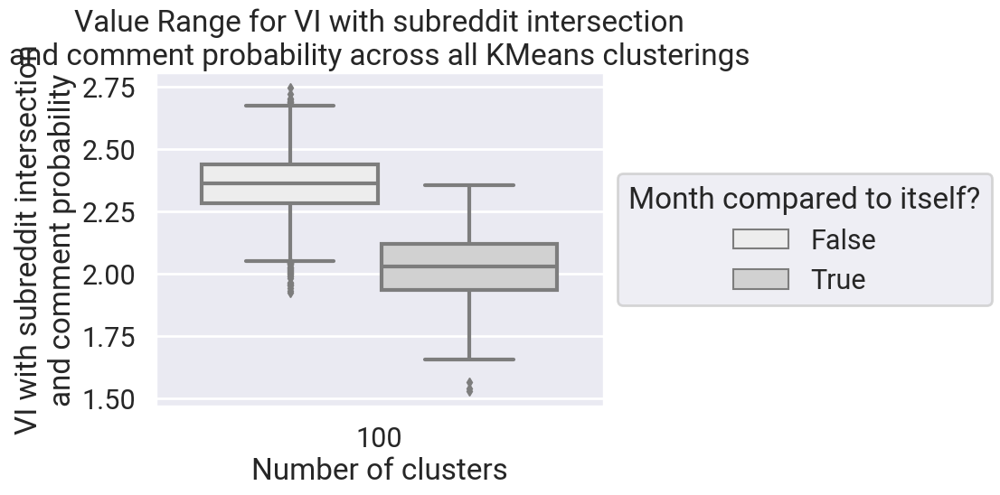

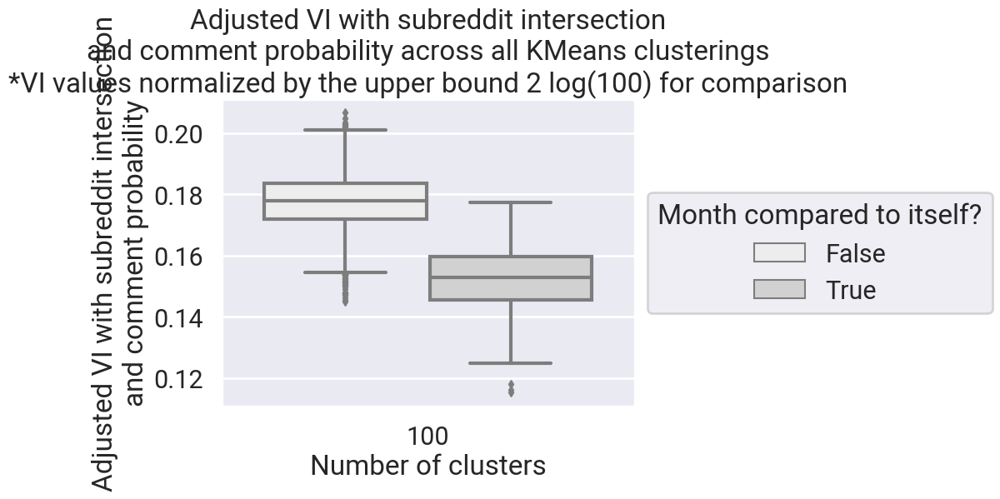

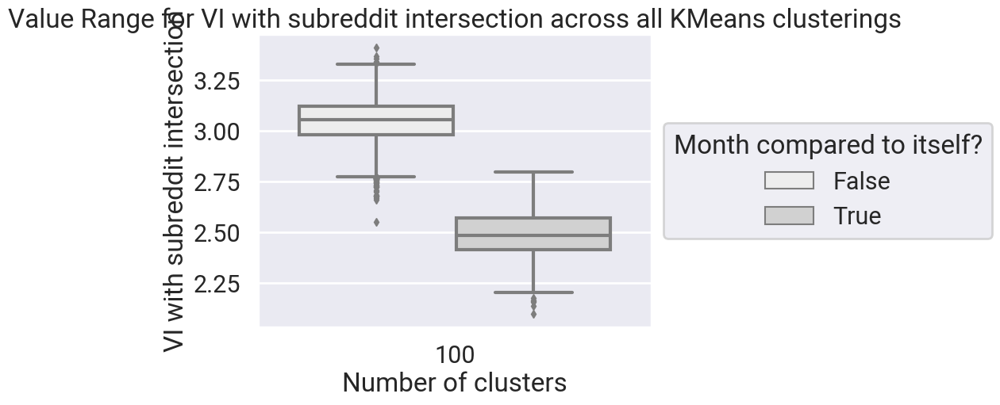

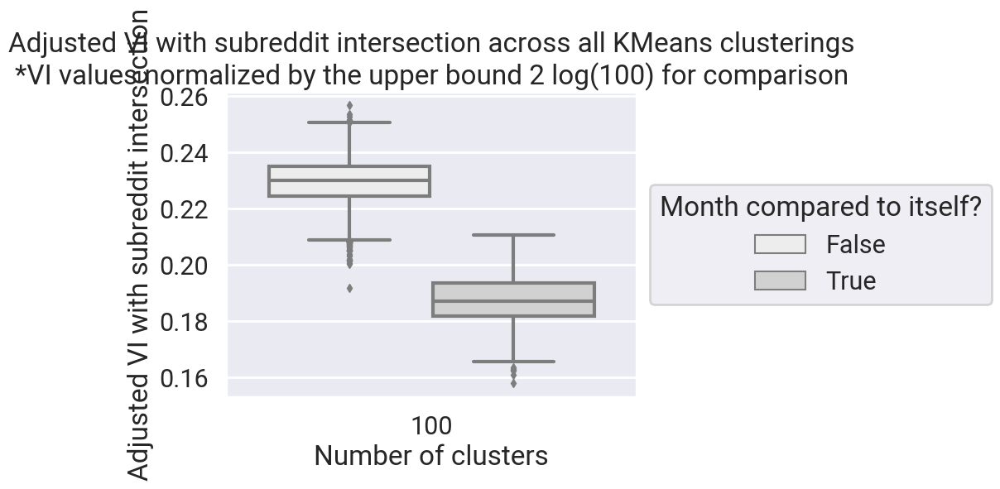

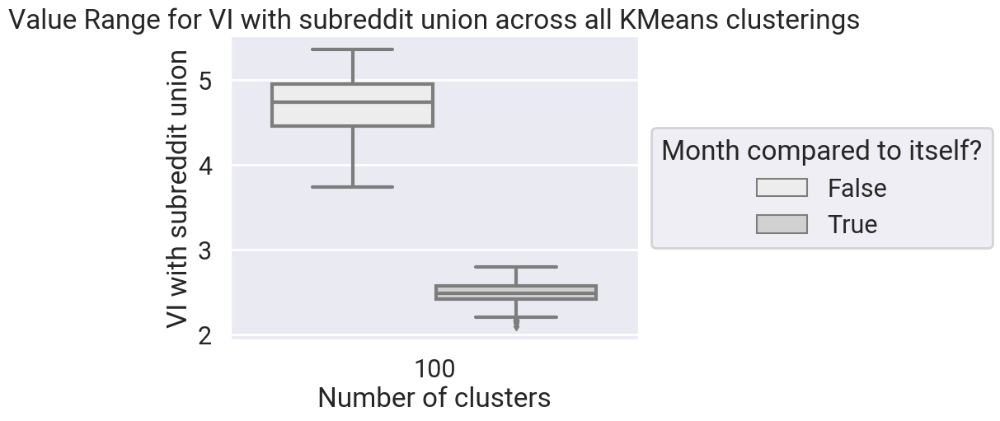

...

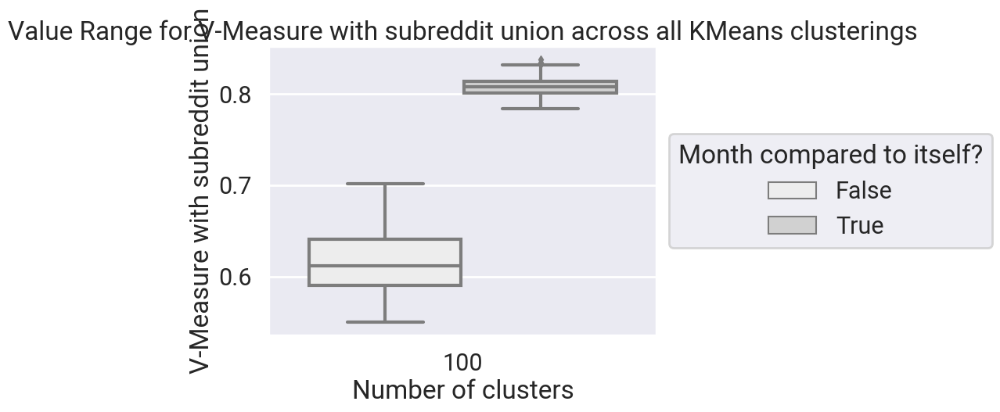

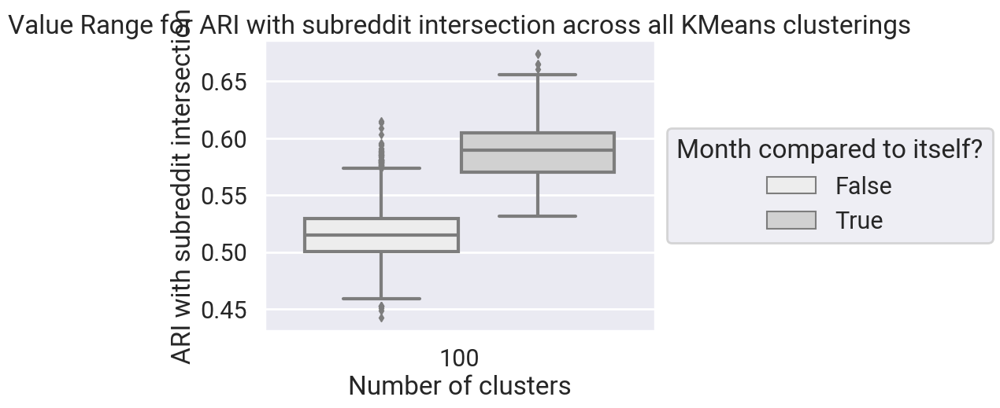

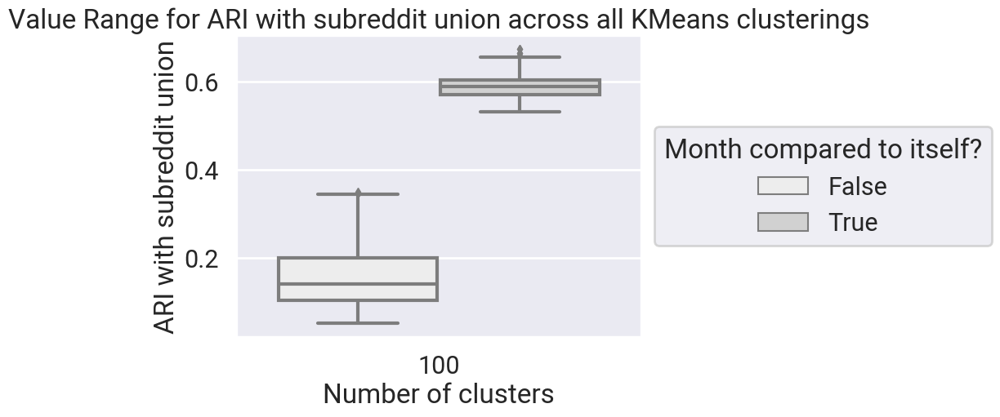

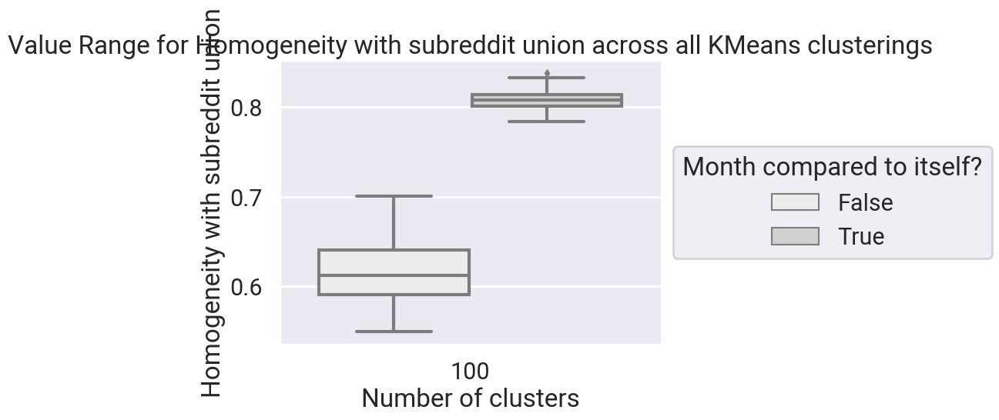

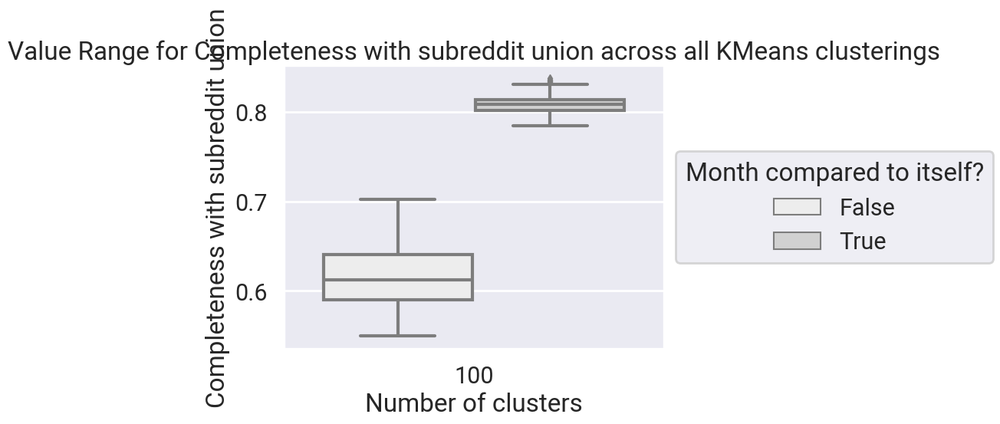

<Figure size 640x480 with 0 Axes>

In [13]:
max_n_clusters = max(NUM_CLUSTERS)
for cluster_comp_metric in ALL_CLUSTER_COMP_METRICS:
    n_cluster_experiments = cluster_comparison_df.copy()
    n_cluster_experiments["month compared to itself"] = n_cluster_experiments["month1"] == n_cluster_experiments["month2"]
    title_friendly_metric = VIZ_TITLES[cluster_comp_metric]
    title = f"Value Range for {title_friendly_metric} across all KMeans clusterings"
    ax = sns.boxplot(data=n_cluster_experiments, y=cluster_comp_metric, x="n_clusters", hue="month compared to itself")
    ax.set(ylabel=title_friendly_metric, title=title, xlabel="Number of clusters")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), title="Month compared to itself?")
    plt.show()
    plt.clf()
    if "variation_of_information" in cluster_comp_metric:
        if "union" in cluster_comp_metric:
            rescale_val = max_n_clusters + 1
        else:
            rescale_val = max_n_clusters
        n_cluster_experiments["adjusted_" + cluster_comp_metric] = n_cluster_experiments[cluster_comp_metric] / (2*np.log2(rescale_val))
        title =f"Adjusted {title_friendly_metric} across all KMeans clusterings\n*VI values normalized by the upper bound 2 log({rescale_val}) for comparison"
        ax = sns.boxplot(data=n_cluster_experiments, y="adjusted_" + cluster_comp_metric, x="n_clusters", hue="month compared to itself")
        ax.set(ylabel=f"Adjusted {title_friendly_metric}", title=title, xlabel="Number of clusters")
        plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), title="Month compared to itself?")
        plt.show()
        plt.clf()



Num clusters: 100
intersection_comment_probability_variation_of_information theoretical max: 13.287712379549449


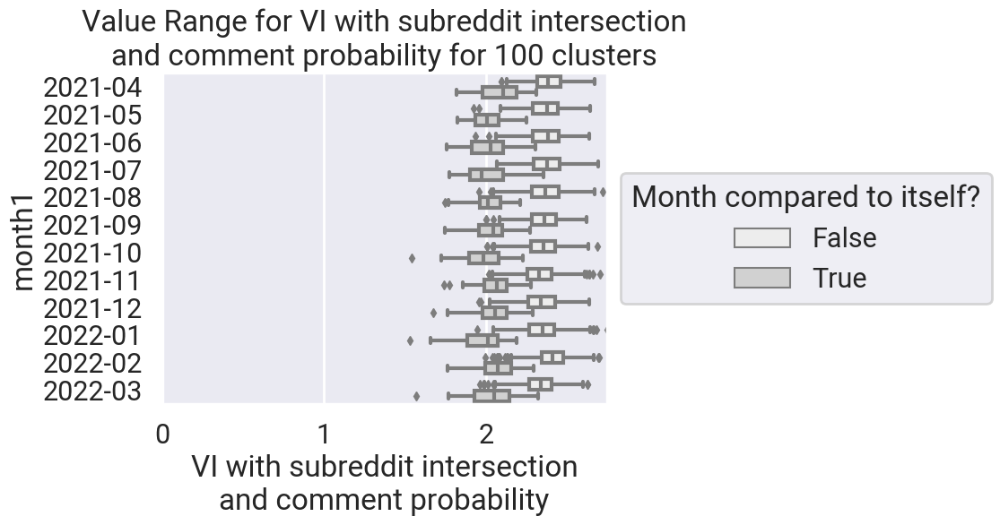

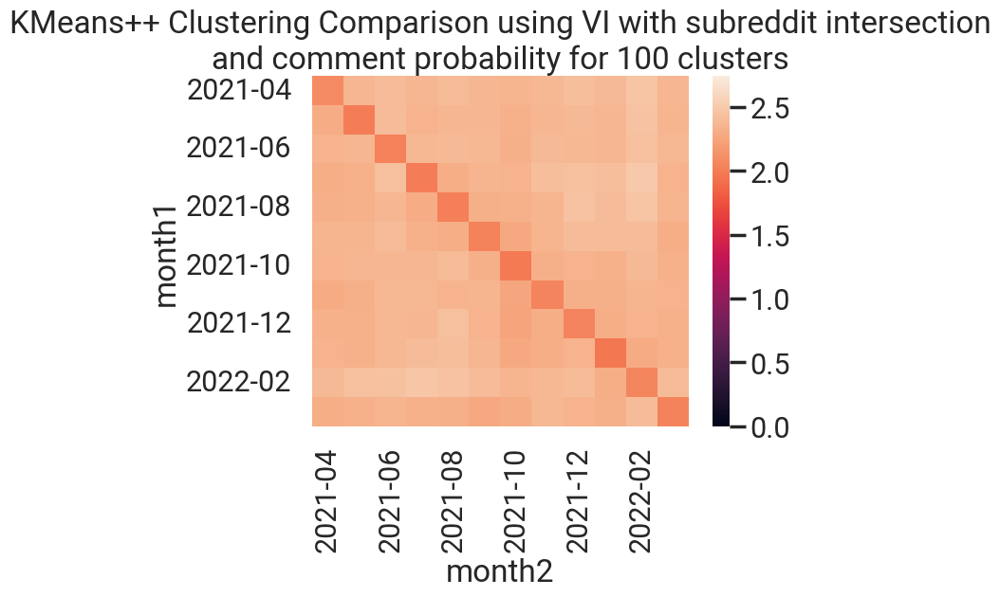

intersection_uniform_probability_variation_of_information theoretical max: 13.287712379549449


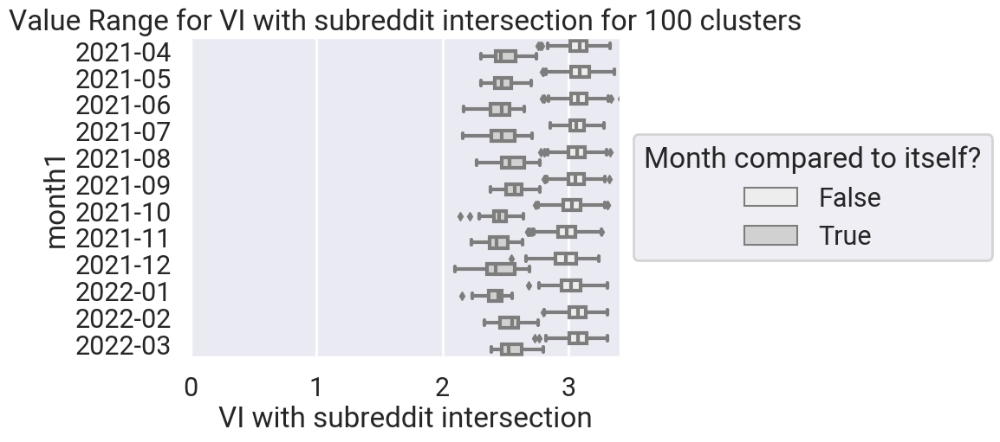

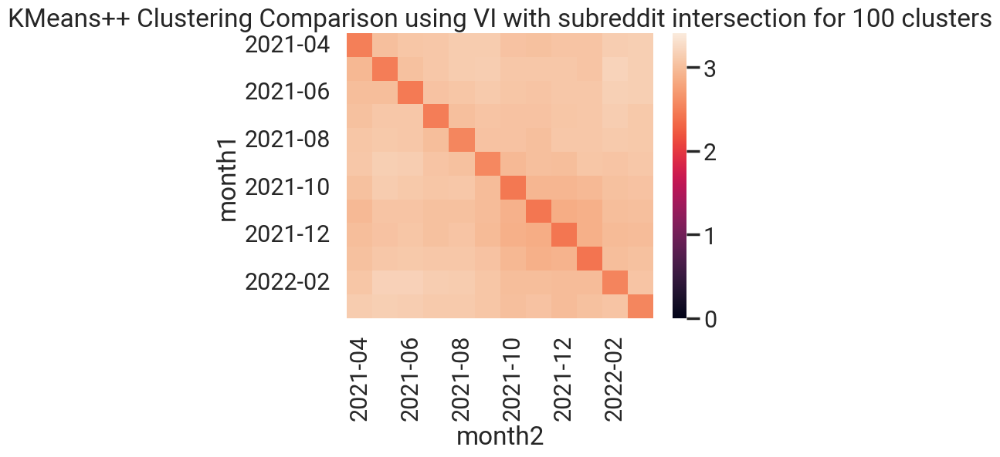

union_uniform_probability_variation_of_information theoretical max: 13.31642296550359


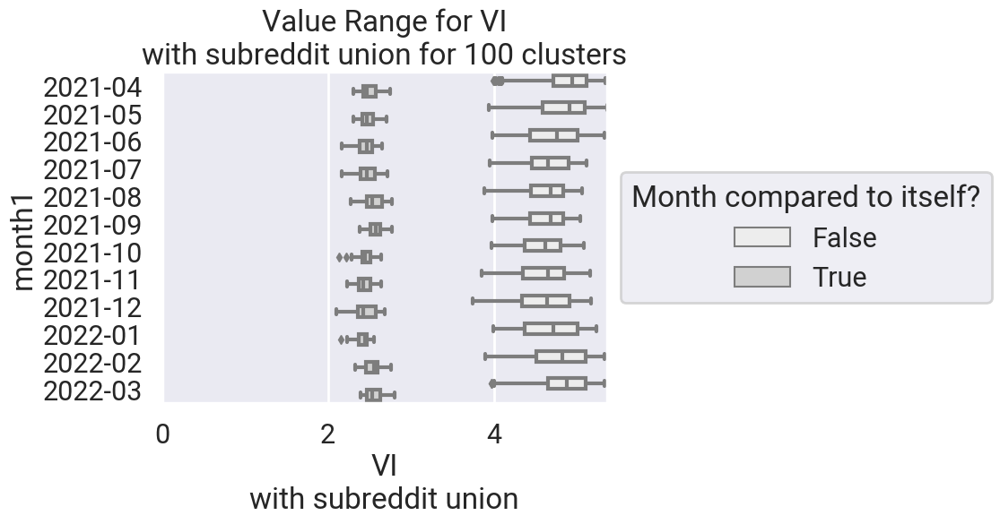

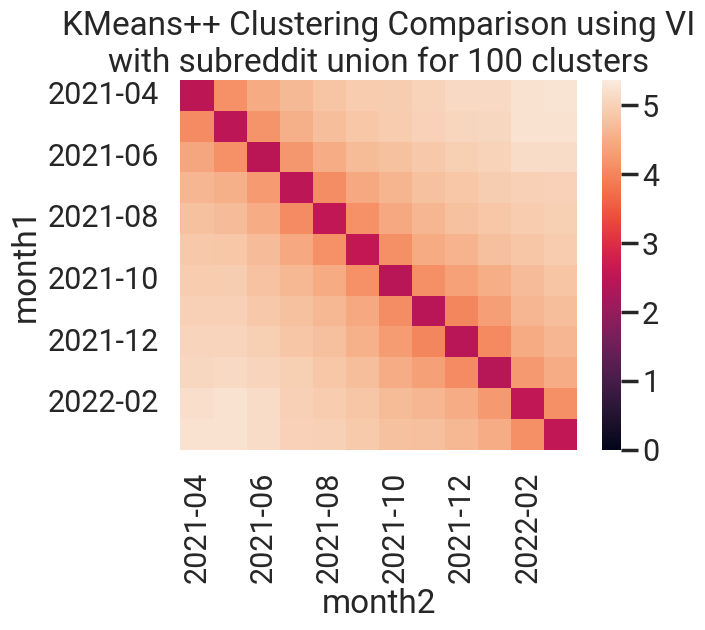

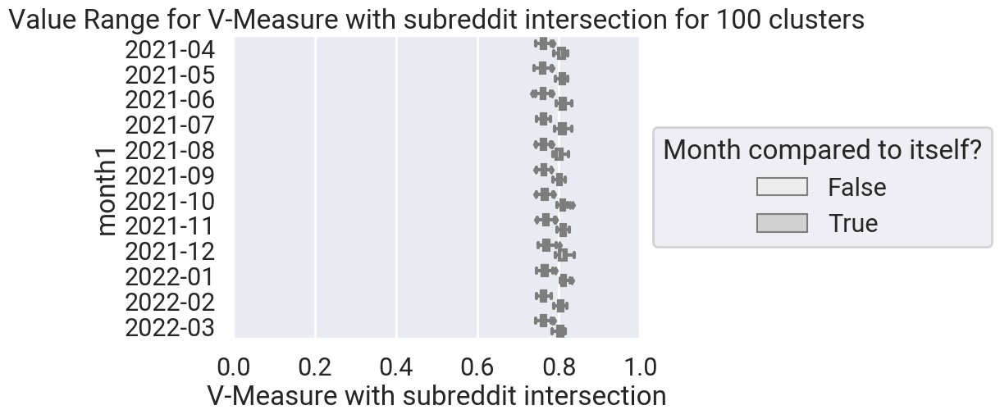

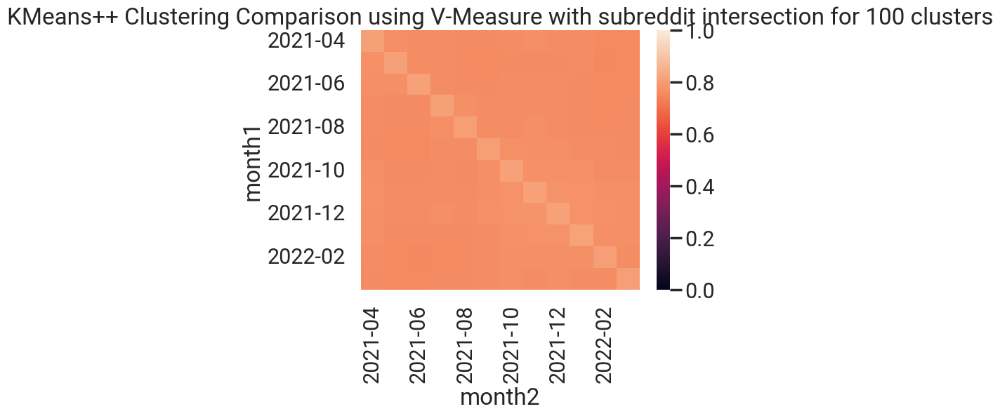

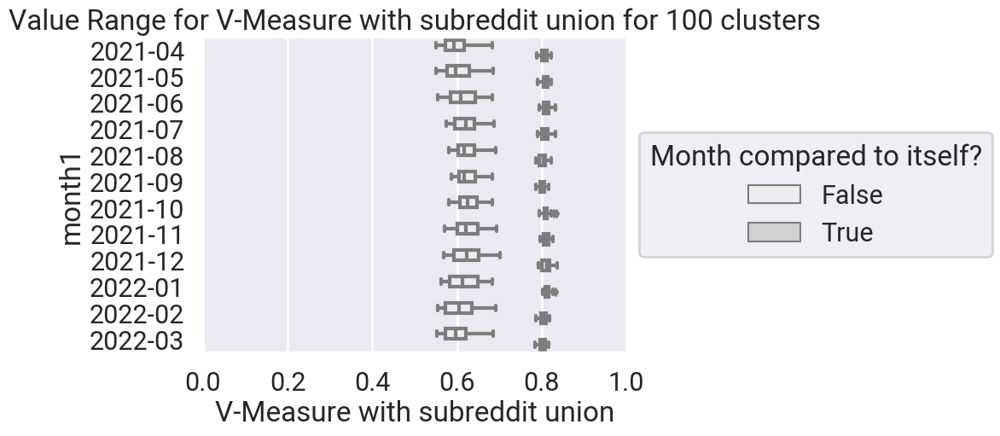

...

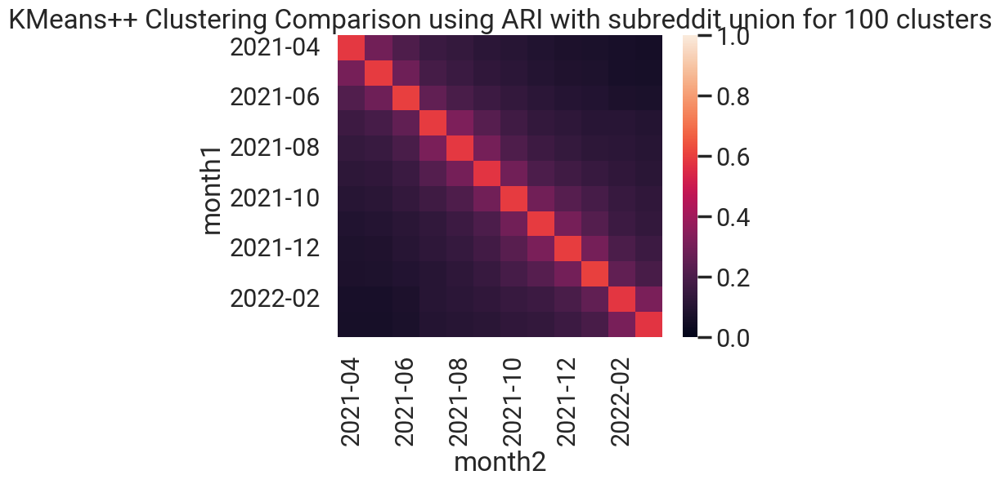

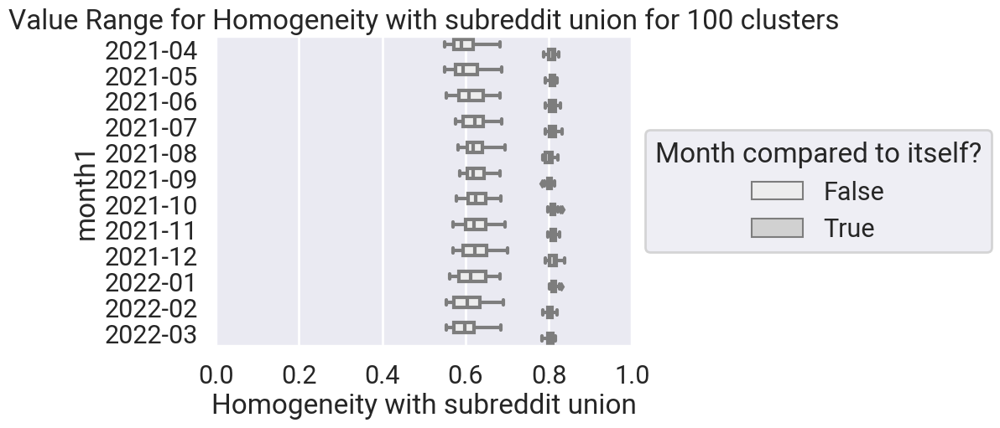

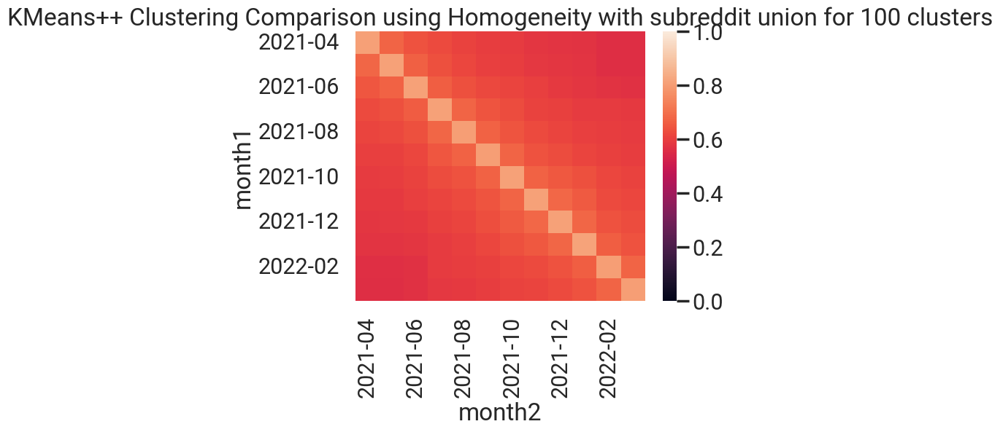

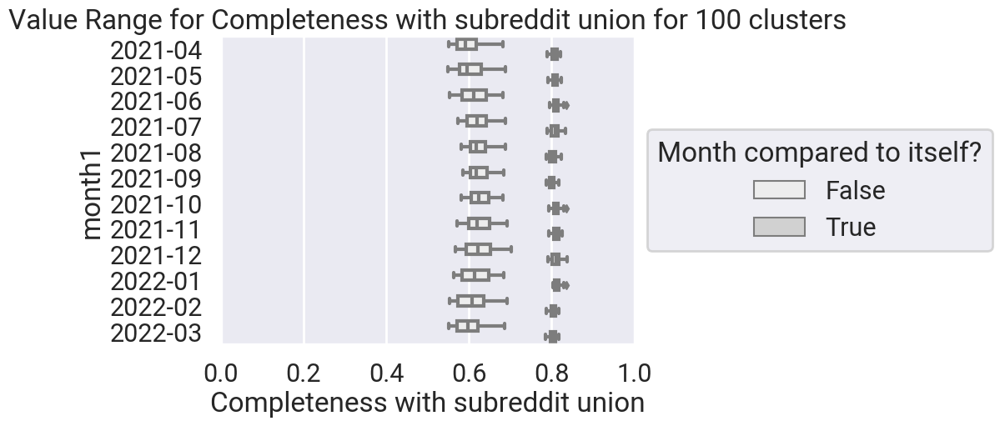

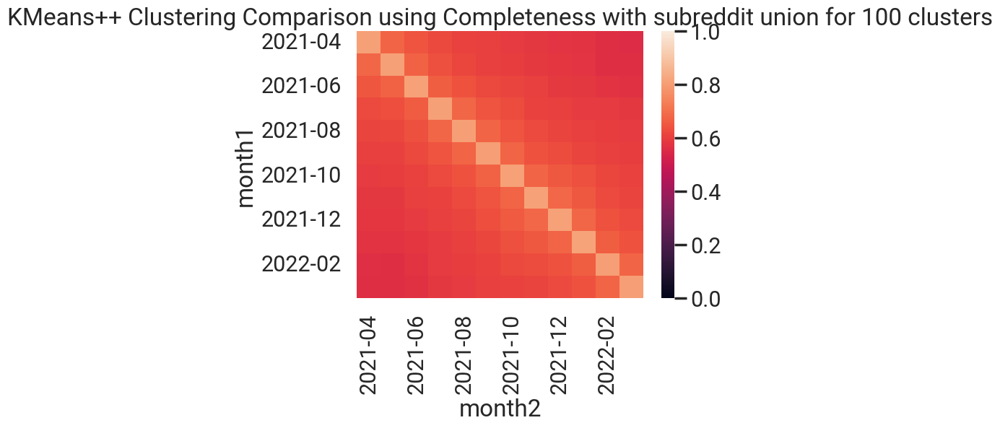

<Figure size 640x480 with 0 Axes>

In [23]:
for n_clusters in NUM_CLUSTERS:
    print("Num clusters:", n_clusters)
    for cluster_comp_metric in ALL_CLUSTER_COMP_METRICS:
        n_cluster_experiments = cluster_comparison_df[cluster_comparison_df["n_clusters"] == n_clusters].copy()
        vmin = 0
        if "variation_of_information" in cluster_comp_metric:
            # Compute the theoretical maximum
            # Max of VOI is 2 log K* when C_1 and C_2 both have at most K* clusters with K* <= sqrt(n)
            if "intersection" in cluster_comp_metric:
                tmax = 2*np.log2(n_clusters) 
                print(cluster_comp_metric, "theoretical max:", tmax)
            elif "union" in cluster_comp_metric:
                tmax = 2*np.log2(n_clusters+1)
                print(cluster_comp_metric, "theoretical max:", tmax)
                
            # But for visualizations, we want the actual maximum, because it makes the gradual changes more obvious
            vmax = n_cluster_experiments[cluster_comp_metric].max()
            
        if "variation_of_information" not in cluster_comp_metric:
            vmax=1
        n_cluster_experiments["month compared to itself"] = n_cluster_experiments["month1"] == n_cluster_experiments["month2"]
        title_friendly_metric = VIZ_TITLES[cluster_comp_metric]
        ax = sns.boxplot(data=n_cluster_experiments, x=cluster_comp_metric, y="month1", hue="month compared to itself")
        ax.set(title=f"Value Range for {title_friendly_metric} for {n_clusters} clusters", xlabel=title_friendly_metric)
        plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), title="Month compared to itself?")
        plt.xlim(vmin, vmax)
        plt.show()
        plt.clf()        
        # Switch comments for gray
        ax = sns.heatmap(n_cluster_experiments.pivot_table(index="month1", columns="month2", values=cluster_comp_metric), vmin=vmin, vmax=vmax)
        #ax = sns.heatmap(n_cluster_experiments.pivot_table(index="month1", columns="month2", values=cluster_comp_metric), vmin=vmin, vmax=vmax, cmap="gray")
        ax.set(title=f"KMeans++ Clustering Comparison using {title_friendly_metric} for {n_clusters} clusters")
        #plt.xticks(rotation=60)
        plt.show()
        plt.clf()
    print()


# Month-to-month Hierarchical Cluster Stability Comparison
Similarly, we'd like to measure the inter-month stability of hierarchical agglomerative clusterings created from the community2vec data. Unlike K-means, hierarchical agglomerative clustering is not sensitive to initialization parameters, other than the user-defined choice of cluster size and linkage type, which determines how distance is computed between clusters. Thus, hierarchical agglomerative clustering is deterministic (except in case of ties in distances between clusters), so we only need to do a single inter-month comparison for each pair of months.

In [15]:
hac_metrics_collection = []
for month, c2v_model in zip(MONTHS, C2V_MODELS):
    print("Training agglomerative clustering models for month:", month)
    vectors = c2v_model.w2v_model.wv
    data = c2v_model.get_normed_vectors()
    index = dict(enumerate(vectors.index_to_key))
    # Month path
    agg_month_path = STABILITY_METRICS_ROOT / f"{month}"
    agg_month_path.mkdir(parents=True, exist_ok=True)
    
    for (link_type, n_clusters) in itertools.product(LINKAGE_TYPES, NUM_CLUSTERS):
        current_agg_model_path = agg_month_path / f"{month}_agglomerative_Linkage{link_type}_numClusters{n_clusters}"
        name = f"{month} Agglomerative Clustering {link_type} linkage {n_clusters} clusters"
        if not current_agg_model_path.exists(): 
            affinity="euclidean" if link_type=="ward" else "cosine"
            agg_model = ic.ClusteringModelFactory.init_clustering_model(model_choice = "agglomerative", data = data, index=index, model_name = name, n_clusters=n_clusters, linkage=link_type, affinity=affinity)
            agg_model.train()
            agg_model.save(current_agg_model_path)
            metrics = agg_model.get_metrics()
            with( current_agg_model_path / "metrics.json").open(mode='w') as metrics_json:
                json.dump(metrics, metrics_json, cls = ihop.utils.NumpyFloatEncoder)
        else: 
            print("\tModel", name, " appears to already exist")
            with (current_agg_model_path / "metrics.json").open(mode="r") as metrics_json:
                metrics = json.load(metrics_json)
        metrics.update({"linkage": link_type, "path":str(current_agg_model_path), "month":month, "n_clusters": n_clusters})
        hac_metrics_collection.append(metrics)
    
hac_metrics_df = pd.DataFrame.from_records(hac_metrics_collection)
display(hac_metrics_df) 

Training agglomerative clustering models for month: 2021-04
	Model 2021-04 Agglomerative Clustering complete linkage 100 clusters  appears to already exist
	Model 2021-04 Agglomerative Clustering average linkage 100 clusters  appears to already exist
	Model 2021-04 Agglomerative Clustering ward linkage 100 clusters  appears to already exist
Training agglomerative clustering models for month: 2021-05
	Model 2021-05 Agglomerative Clustering complete linkage 100 clusters  appears to already exist
	Model 2021-05 Agglomerative Clustering average linkage 100 clusters  appears to already exist
	Model 2021-05 Agglomerative Clustering ward linkage 100 clusters  appears to already exist
Training agglomerative clustering models for month: 2021-06
	Model 2021-06 Agglomerative Clustering complete linkage 100 clusters  appears to already exist
	Model 2021-06 Agglomerative Clustering average linkage 100 clusters  appears to already exist
	Model 2021-06 Agglomerative Clustering ward linkage 100 cluste

,Silhouette,Calinski-Harabasz,Davies-Bouldin,linkage,path,month,n_clusters
0,0.046809,40.225900,3.653925,complete,../data/cluster_stability/2021-04/2021-04_aggl...,2021-04,100
1,0.066528,33.063556,2.358039,average,../data/cluster_stability/2021-04/2021-04_aggl...,2021-04,100
2,0.064037,49.362964,3.229816,ward,../data/cluster_stability/2021-04/2021-04_aggl...,2021-04,100
3,0.046243,40.891053,3.518757,complete,../data/cluster_stability/2021-05/2021-05_aggl...,2021-05,100
4,0.073714,34.945164,2.261186,average,../data/cluster_stability/2021-05/2021-05_aggl...,2021-05,100
5,0.072897,50.552269,3.239835,ward,../data/cluster_stability/2021-05/2021-05_aggl...,2021-05,100
6,0.058607,43.311300,3.367860,complete,../data/cluster_stability/2021-06/2021-06_aggl...,2021-06,100
7,0.075900,35.084774,2.312386,average,../data/cluster_stability/2021-06/2021-06_aggl...,2021-06,100
8,0.070851,51.059919,3.224671,ward,../data/cluster_stability/2021-06/2021-06_aggl...,2021-06,100
9,0.043407,39.327126,3.718022,complete,../data/cluster_stability/2021-07/2021-07_aggl...,2021-07,100


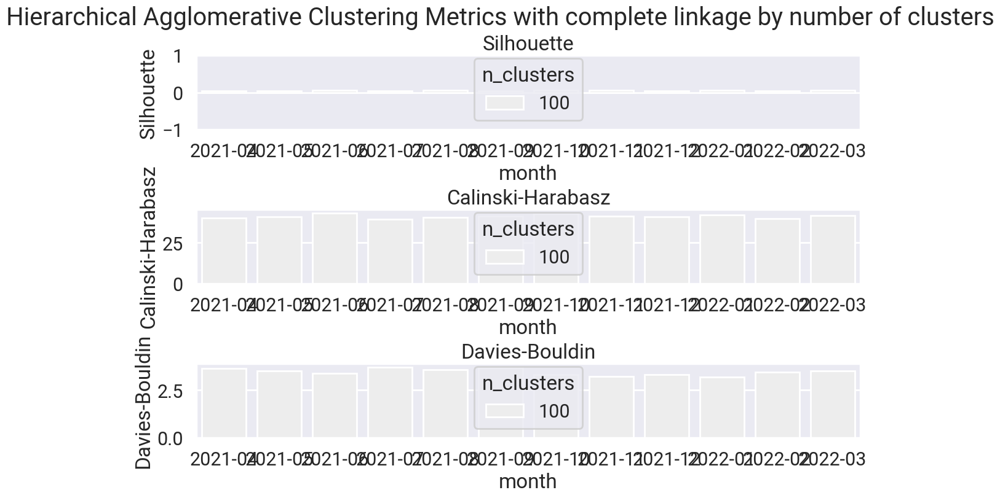

<Figure size 640x480 with 0 Axes>

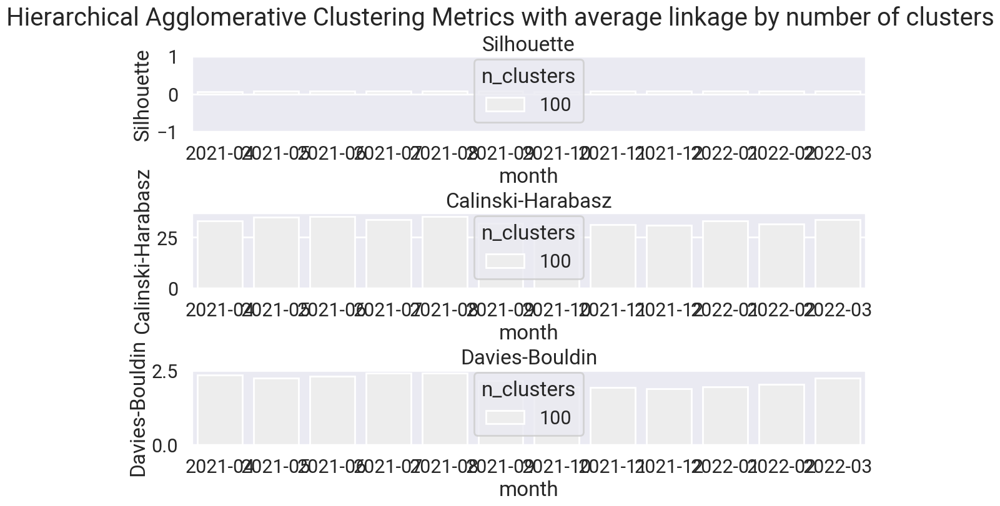

<Figure size 640x480 with 0 Axes>

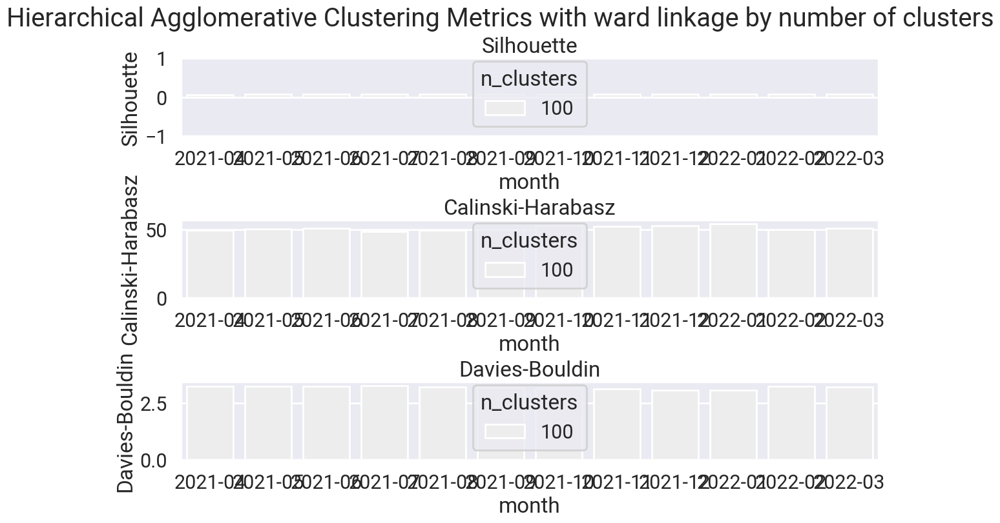

<Figure size 640x480 with 0 Axes>

In [16]:
for l in LINKAGE_TYPES:
    fig, axes = plt.subplots(ncols = 1, nrows=3, figsize=(12,8), constrained_layout=True)
    fig.suptitle(f"Hierarchical Agglomerative Clustering Metrics with {l} linkage by number of clusters")
    tmp_linkage_df =hac_metrics_df[hac_metrics_df["linkage"]==l]
    for i, metric_key in enumerate(["Silhouette", "Calinski-Harabasz", "Davies-Bouldin"]):
        if metric_key=="Silhouette":
            axes[i].set(ylim=(-1, 1))
        sns.barplot(ax = axes[i], x="month", y=metric_key, order=MONTHS, data=tmp_linkage_df, hue="n_clusters")
        axes[i].set_title(metric_key)
    plt.show()
    plt.clf()


In [17]:
# Pairwise comparison between HAC assignments of subreddits
all_hac_comparison_results = []
comp_counter = 0
for (l, num_clusters) in itertools.product(LINKAGE_TYPES, NUM_CLUSTERS):
    print("Linkage type:", l, ", Num clusters:", num_clusters)
    # Compare month by month, experiment number i gets compared to all other experiments 
    # numbered i+1 or greater over all months
    for i1, month1 in enumerate(MONTHS):
        # Read in experiment 1 data
        month1_counts_dict = pd.read_csv(SUBREDDIT_COUNTS_CSVS[i1]).to_dict("records")
        month1_counts = {d["subreddit"]: d["count"] for d in month1_counts_dict}
    
        current_hac_path = STABILITY_METRICS_ROOT / f"{month1}" / f"{month1}_agglomerative_Linkage{l}_numClusters{num_clusters}" 
        current_hac_model = ic.ClusteringModel.load(current_hac_path, 
            C2V_MODELS[i1].get_normed_vectors(),
            C2V_MODELS[i1].get_index_as_dict(),
        )
        current_model_assignments = current_hac_model.get_cluster_assignments_as_dict()

        # Read in experiment 2 data
        for i2, month2 in enumerate(MONTHS):
            month2_counts_dict = pd.read_csv(SUBREDDIT_COUNTS_CSVS[i2]).to_dict("records")
            month2_counts = {d["subreddit"]: d["count"] for d in month2_counts_dict}
            hac_comparison_path = STABILITY_METRICS_ROOT / f"{month2}" / f"{month2}_agglomerative_Linkage{l}_numClusters{num_clusters}" 
            hac_comparison_model = ic.ClusteringModel.load(
                hac_comparison_path, 
                C2V_MODELS[i2].get_normed_vectors(),
                C2V_MODELS[i2].get_index_as_dict()
                )
            comparison_model_assignments = hac_comparison_model.get_cluster_assignments_as_dict()

            # Compare the experiments and collect results
            comparison_results = {"linkage":l, "num_clusters": num_clusters, "month1": month1, "month2":month2}
            intersection_comparison_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=False,
            cluster_1_counts = month1_counts, 
            cluster_2_counts = month2_counts)
            comparison_results.update(intersection_comparison_results)

            intersection_uniform_prob_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=False)
            comparison_results.update(intersection_uniform_prob_results)

            union_comparison_results = ic.compare_cluterings(current_model_assignments, comparison_model_assignments, use_union=True,
            cluster_1_counts = month1_counts, 
            cluster_2_counts = month2_counts)
            comparison_results.update(union_comparison_results)

            all_hac_comparison_results.append(comparison_results)

hac_cluster_comparison_df = pd.DataFrame.from_records(all_hac_comparison_results)
display(hac_cluster_comparison_df)

Linkage type: complete , Num clusters: 100


/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimat

Linkage type: average , Num clusters: 100


/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimat

Linkage type: ward , Num clusters: 100


/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator AgglomerativeClustering from version 1.0.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/virginia/miniconda3/envs/reddit/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimat

,linkage,num_clusters,month1,month2,intersection_comment_probability_variation_of_information,intersection_uniform_probability_adjusted_rand_index,intersection_uniform_probability_rand_index,intersection_uniform_probability_normalized_mutual_info,intersection_uniform_probability_homogeneity,intersection_uniform_probability_completeness,intersection_uniform_probability_v_measure,intersection_uniform_probability_variation_of_information,union_uniform_probability_adjusted_rand_index,union_uniform_probability_rand_index,union_uniform_probability_normalized_mutual_info,union_uniform_probability_homogeneity,union_uniform_probability_completeness,union_uniform_probability_v_measure,union_uniform_probability_variation_of_information
0,complete,100,2021-04,2021-04,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000e+00
1,complete,100,2021-04,2021-05,3.655825,0.321708,0.975147,0.623955,0.620058,0.627900,0.623955,4.600425e+00,0.208329,0.967047,0.546058,0.542913,0.549240,0.546058,5.454373e+00
2,complete,100,2021-04,2021-06,3.591814,0.338732,0.975976,0.631873,0.628373,0.635413,0.631873,4.503127e+00,0.166151,0.959502,0.529701,0.526819,0.532615,0.529701,5.573407e+00
3,complete,100,2021-04,2021-07,3.635088,0.305528,0.976931,0.620531,0.618880,0.622191,0.620531,4.682191e+00,0.117293,0.953031,0.504755,0.504200,0.505312,0.504755,5.846234e+00
4,complete,100,2021-04,2021-08,3.508190,0.345944,0.975673,0.625024,0.619207,0.630952,0.625024,4.593346e+00,0.126249,0.948037,0.500484,0.497334,0.503675,0.500484,5.839881e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,ward,100,2022-03,2021-11,2.255119,0.477277,0.986156,0.757499,0.757153,0.757846,0.757499,3.098194e+00,0.133945,0.955114,0.604263,0.603885,0.604641,0.604263,4.790884e+00
428,ward,100,2022-03,2021-12,2.135687,0.559210,0.987852,0.766794,0.765125,0.768470,0.766794,2.974049e+00,0.187691,0.960770,0.622669,0.621008,0.624338,0.622669,4.587547e+00
429,ward,100,2022-03,2022-01,2.300276,0.473103,0.986080,0.755671,0.754980,0.756363,0.755671,3.121206e+00,0.185621,0.965160,0.628551,0.628102,0.629000,0.628551,4.547735e+00
430,ward,100,2022-03,2022-02,2.183485,0.531520,0.987149,0.763235,0.762249,0.764224,0.763235,3.017302e+00,0.334715,0.978320,0.673995,0.673243,0.674749,0.673995,4.075316e+00


In [18]:
hac_cluster_comparison_df.to_csv(STABILITY_METRICS_ROOT / "hac_cluster_comparison_metrics.csv", index=False)

,month1,month2,linkage,num_clusters,intersection_comment_probability_variation_of_information,intersection_uniform_probability_adjusted_rand_index,intersection_uniform_probability_rand_index,intersection_uniform_probability_normalized_mutual_info,intersection_uniform_probability_homogeneity,intersection_uniform_probability_completeness,intersection_uniform_probability_v_measure,intersection_uniform_probability_variation_of_information,union_uniform_probability_adjusted_rand_index,union_uniform_probability_rand_index,union_uniform_probability_normalized_mutual_info,union_uniform_probability_homogeneity,union_uniform_probability_completeness,union_uniform_probability_v_measure,union_uniform_probability_variation_of_information
0,2021-04,2021-05,complete,100,3.655825,0.321708,0.975147,0.623955,0.620058,0.627900,0.623955,4.600425,0.208329,0.967047,0.546058,0.542913,0.549240,0.546058,5.454373
1,2021-04,2021-05,average,100,2.100674,0.622526,0.962693,0.735605,0.740428,0.730844,0.735605,2.423422,0.474412,0.950109,0.632801,0.635566,0.630060,0.632801,3.443112
2,2021-04,2021-05,ward,100,2.429435,0.444160,0.985675,0.750266,0.749705,0.750828,0.750266,3.196603,0.258579,0.975967,0.657135,0.656915,0.657356,0.657135,4.291423
3,2021-04,2021-06,complete,100,3.591814,0.338732,0.975976,0.631873,0.628373,0.635413,0.631873,4.503127,0.166151,0.959502,0.529701,0.526819,0.532615,0.529701,5.573407
4,2021-04,2021-06,average,100,2.142844,0.617405,0.962112,0.734923,0.741136,0.728814,0.734923,2.443758,0.398763,0.940054,0.602674,0.604805,0.600558,0.602674,3.712016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,2022-01,2022-03,average,100,2.019698,0.657271,0.960575,0.738906,0.760205,0.718767,0.738906,2.248999,0.417471,0.932917,0.598113,0.613356,0.583609,0.598113,3.559527
194,2022-01,2022-03,ward,100,2.300276,0.473103,0.986080,0.755671,0.756363,0.754980,0.755671,3.121206,0.185621,0.965160,0.628551,0.629000,0.628102,0.628551,4.547735
195,2022-02,2022-03,complete,100,3.562852,0.367867,0.976250,0.623947,0.623521,0.624373,0.623947,4.583521,0.250685,0.969103,0.550430,0.549871,0.550989,0.550430,5.402964
196,2022-02,2022-03,average,100,1.963522,0.699711,0.966435,0.741463,0.755562,0.727879,0.741463,2.237342,0.554067,0.952910,0.641590,0.651979,0.631527,0.641590,3.215947


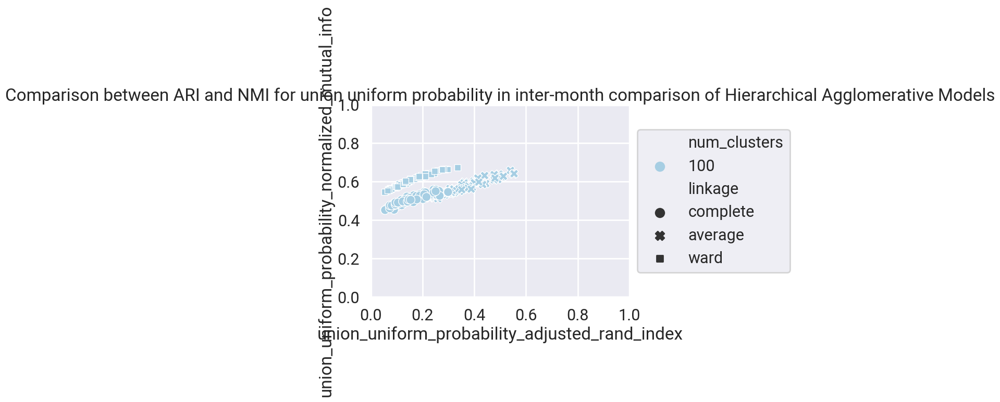

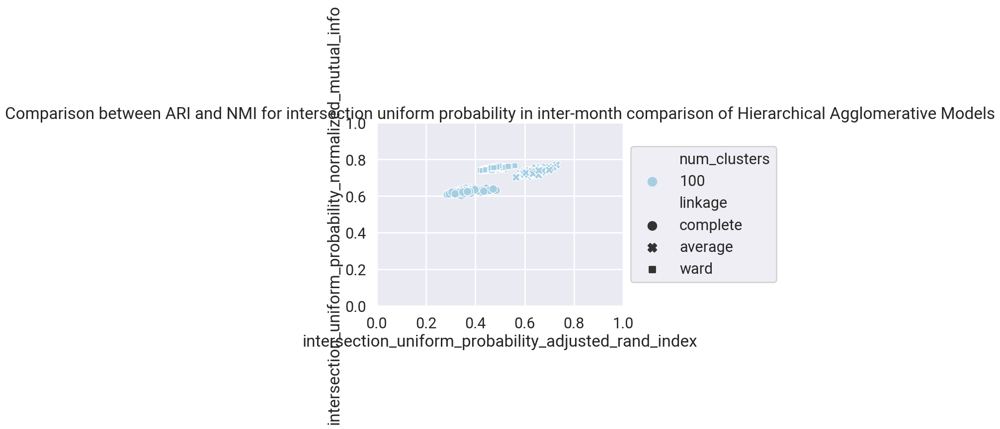

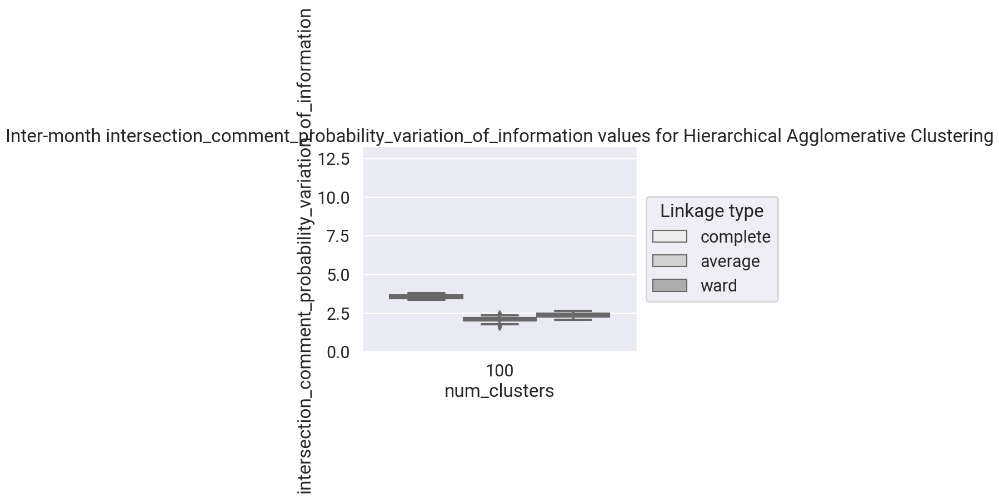

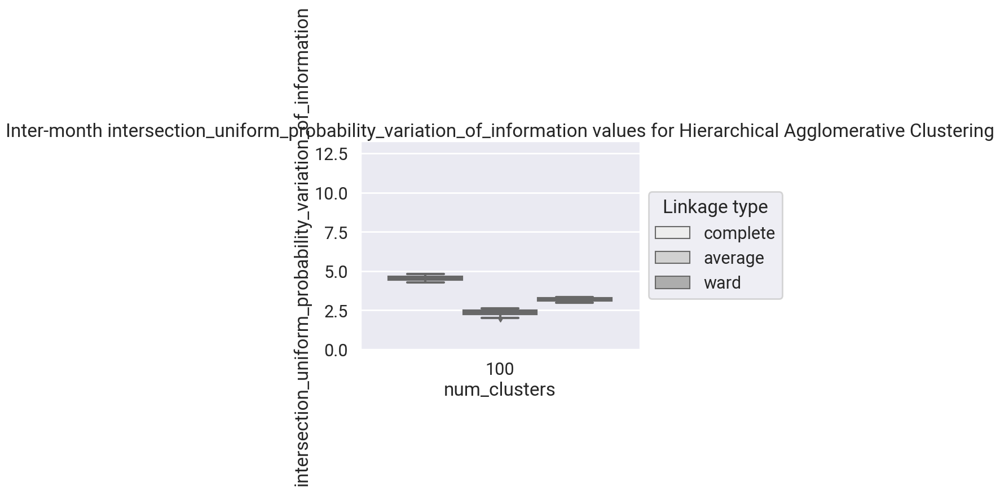

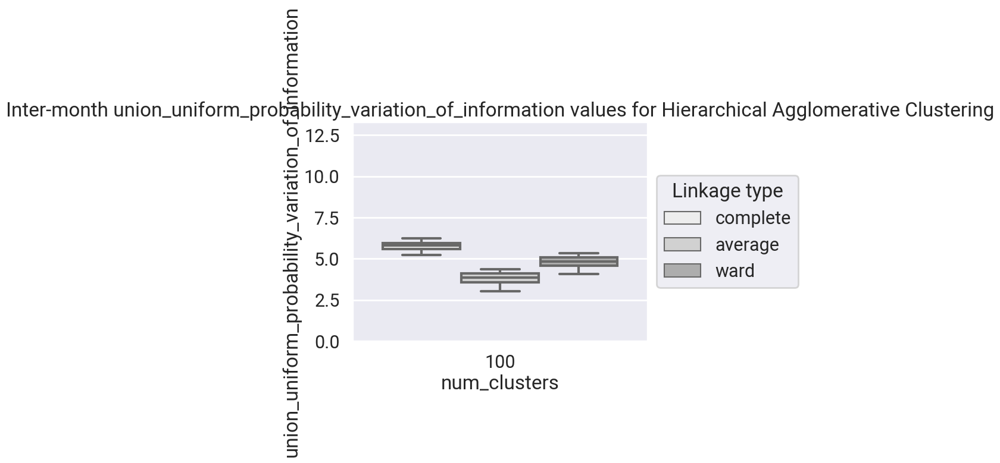

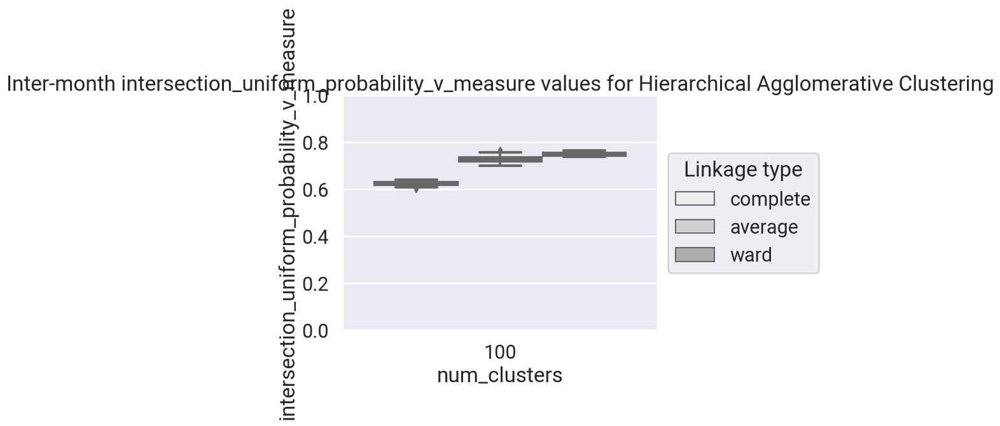

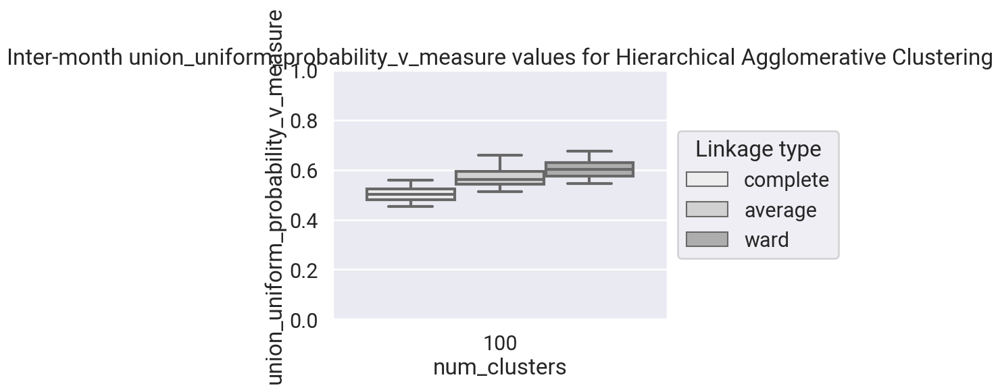

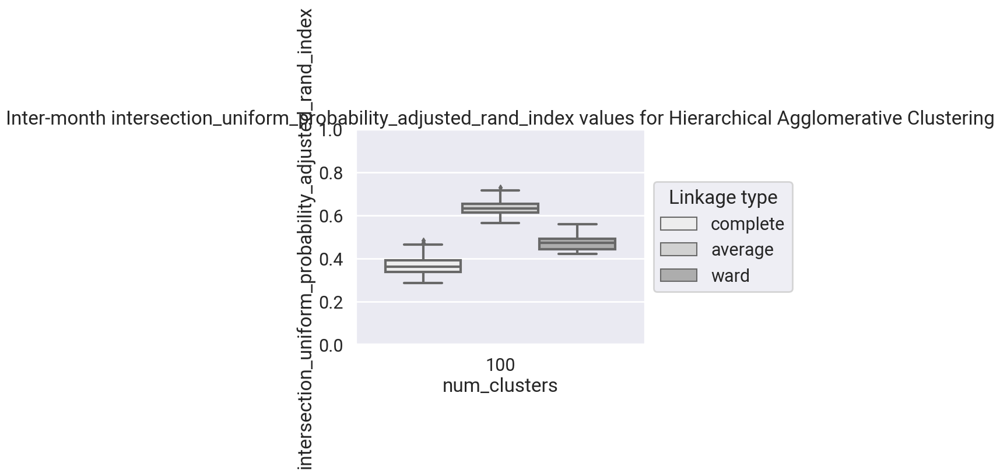

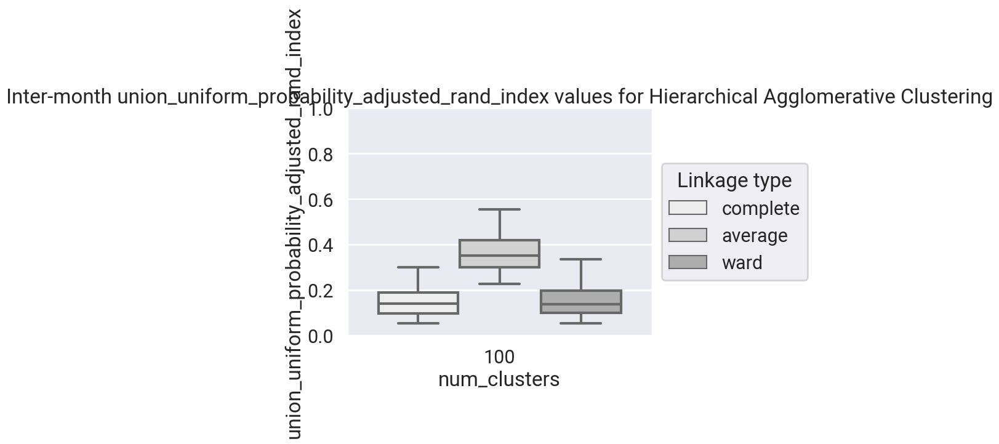

<Figure size 640x480 with 0 Axes>

In [19]:
hac_cluster_comparison_df = pd.read_csv(STABILITY_METRICS_ROOT / "hac_cluster_comparison_metrics.csv")
# For symmetric measures (everything except homogeneity and completeness), I'd like to get the average range over experiments 
month1s = list()
month2s = list()
for i, m1 in enumerate(MONTHS):
    for m2 in MONTHS[i+1:]:
        month1s.append(m1)
        month2s.append(m2)

month_filter = pd.DataFrame(data={"month1":month1s, "month2":month2s})
df_for_averages = pd.merge(month_filter, hac_cluster_comparison_df, how="left", on=["month1", "month2"])
display(df_for_averages)

# NMI and ARI are confusing me, what's the relation betwen them?
for prefix  in ["union", "intersection"]:

    ax = sns.scatterplot(data=df_for_averages, x=f"{prefix}_uniform_probability_adjusted_rand_index", y=f"{prefix}_uniform_probability_normalized_mutual_info", hue="num_clusters", style="linkage", legend="full", palette="Paired")
    ax.set(ylim=(0,1), xlim=(0,1))
    ax.set_title(f"Comparison between ARI and NMI for {prefix} uniform probability in inter-month comparison of Hierarchical Agglomerative Models")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.show()
    plt.clf()


for metric in SYMMETRIC_METRICS:
    vmin = 0
    if "variation_of_information" in metric:
        # Max of VOI is 2 log K when C_1 and C_2 both have at most K* clusters
        if "intersection" in metric:
            vmax = 2*np.log2(max(NUM_CLUSTERS))
        elif "union" in metric:
            vmax = 2*np.log2(max(NUM_CLUSTERS) + 1)
    else:
        vmax=1
    ax = sns.boxplot(data=df_for_averages, y=metric, x="num_clusters", hue="linkage", order=NUM_CLUSTERS)
    ax.set_title(f"Inter-month {metric} values for Hierarchical Agglomerative Clustering")
    ax.set(ylim=(vmin, vmax))
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), title="Linkage type")
    plt.show()
    plt.clf()


Linkage: complete Num Clusters: 100


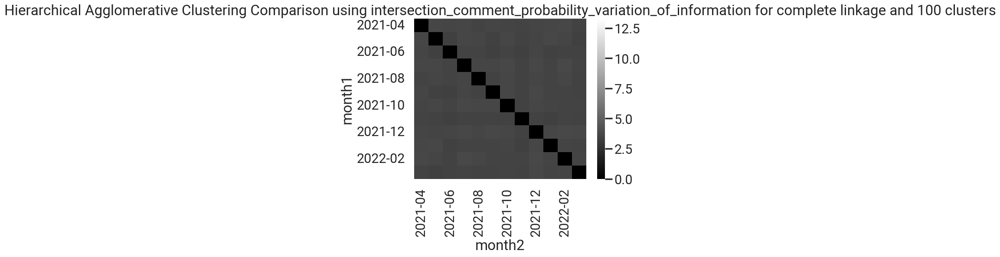

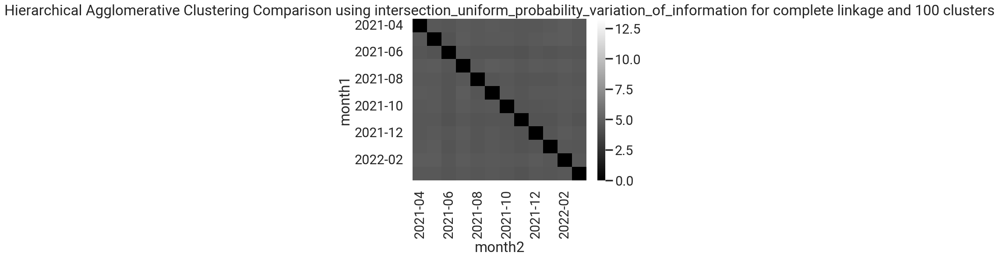

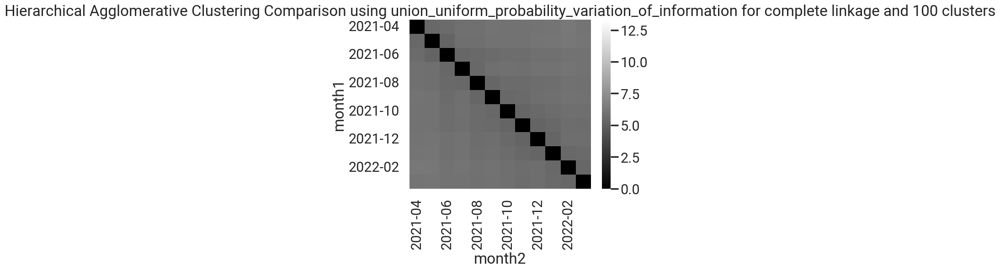

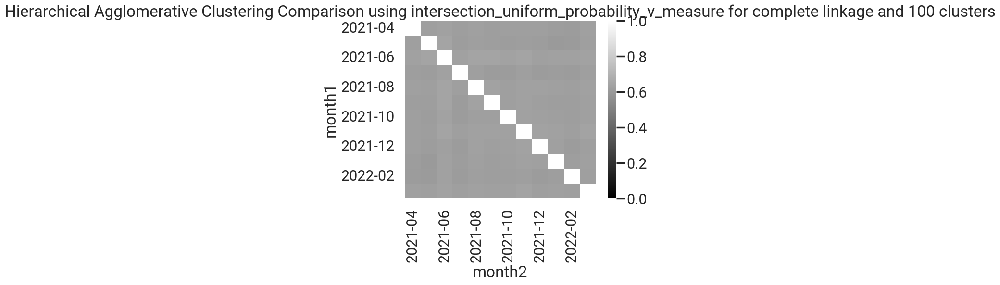

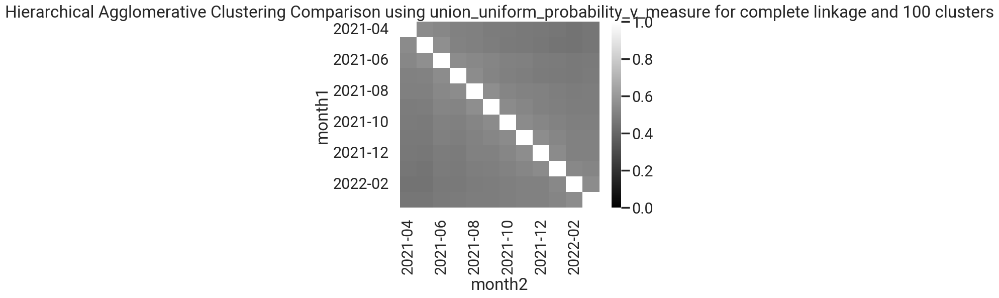

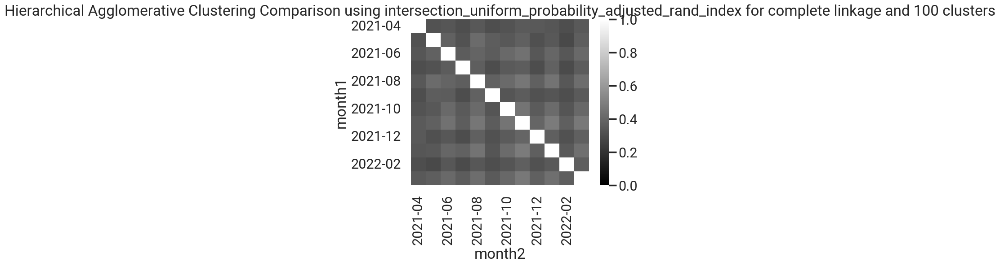

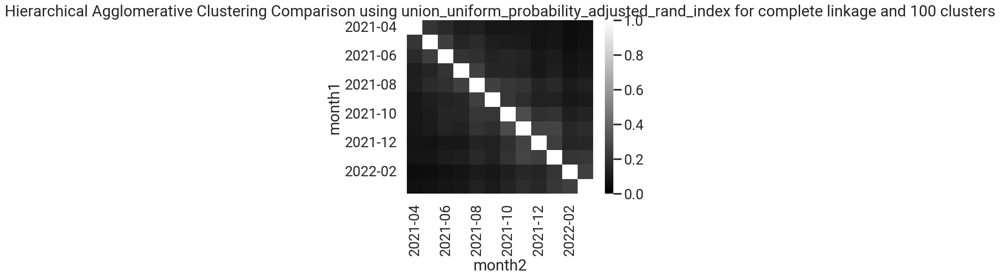

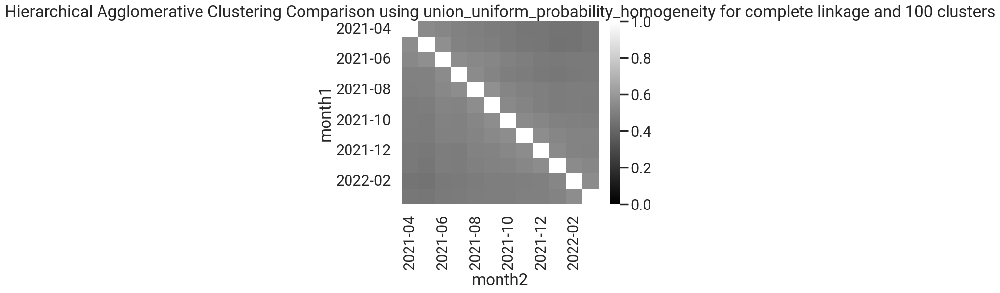

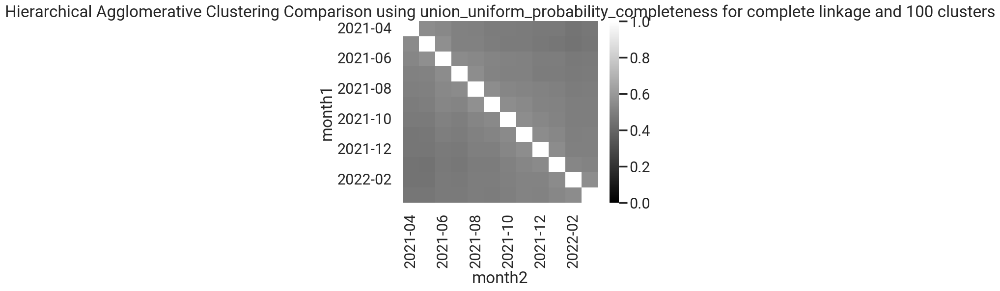

Linkage: average Num Clusters: 100


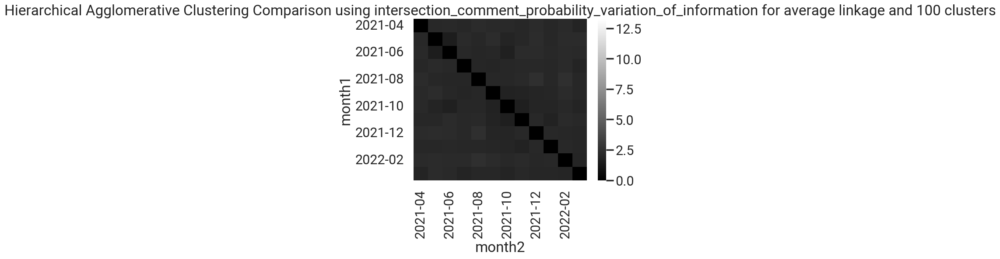

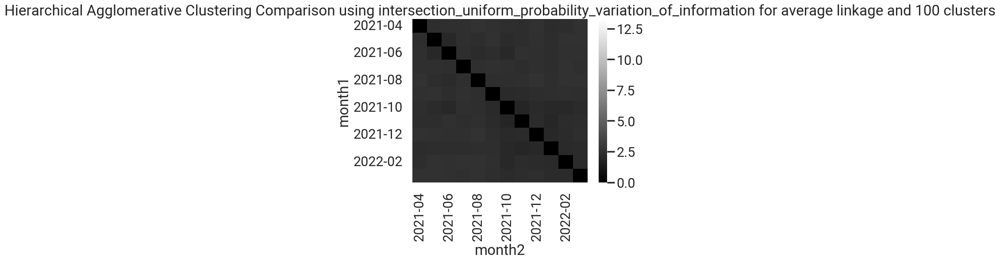

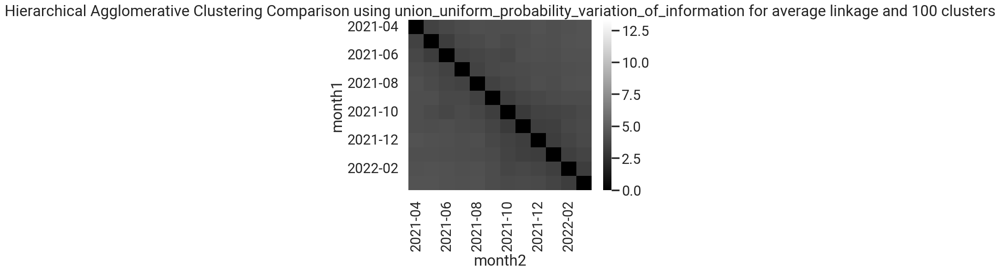

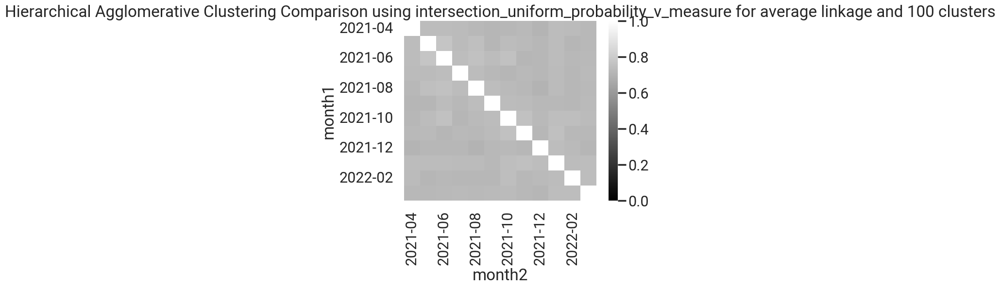

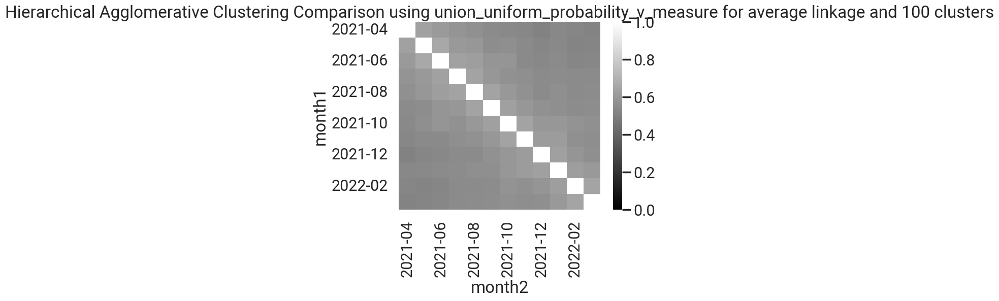

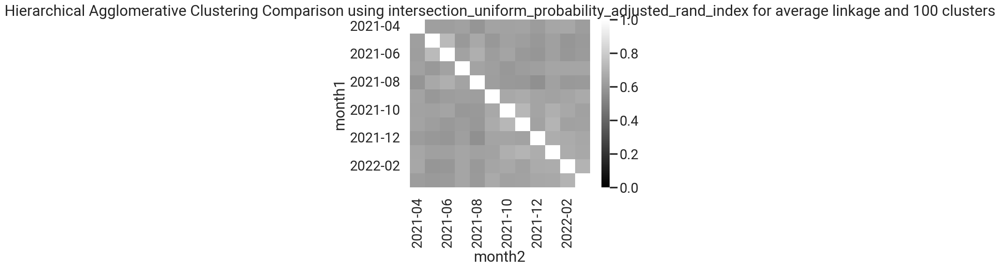

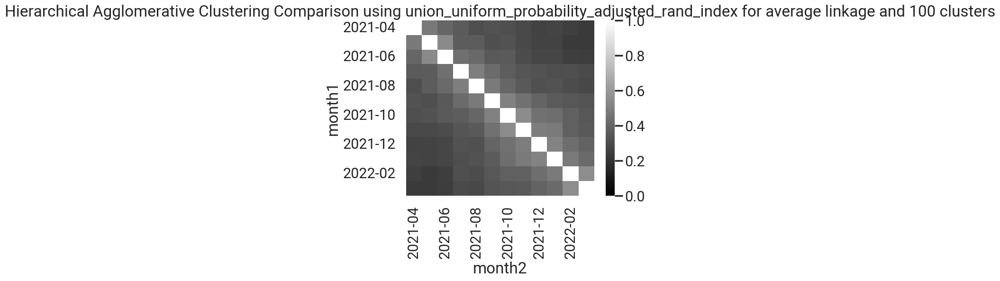

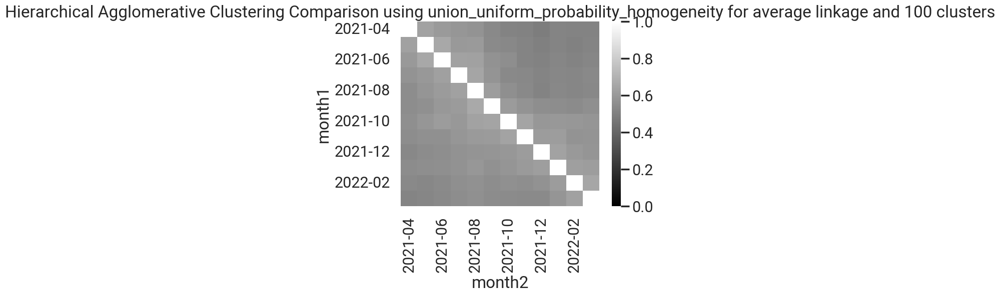

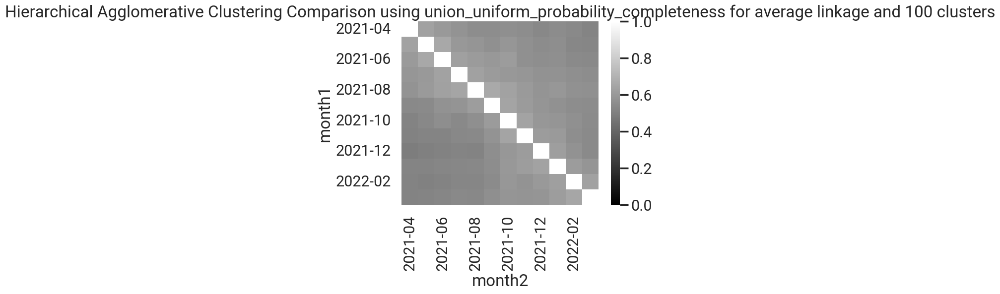

Linkage: ward Num Clusters: 100


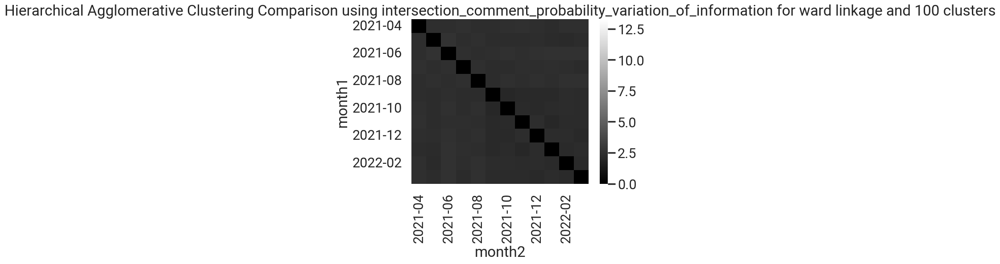

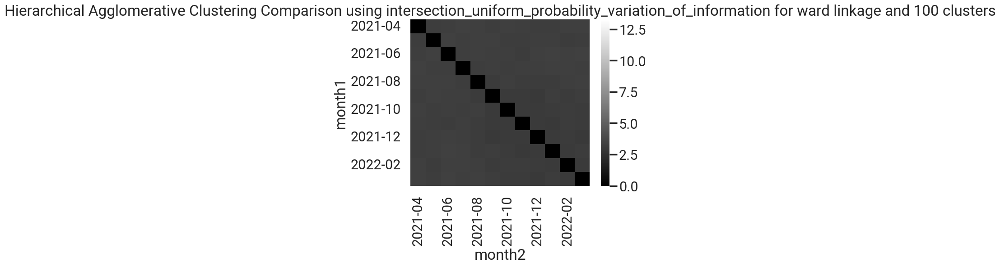

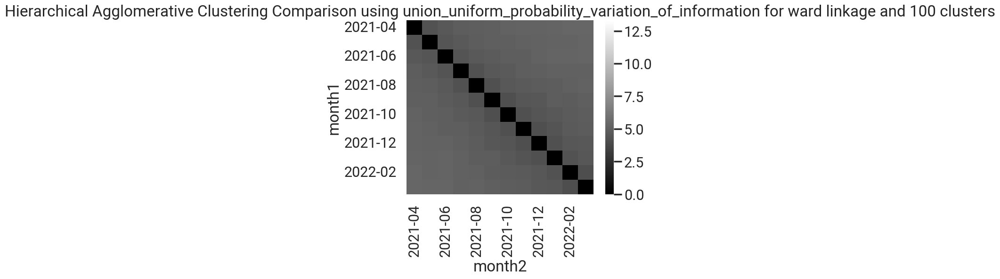

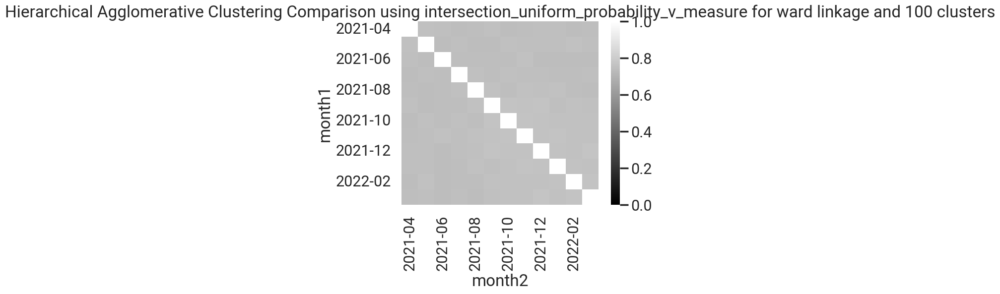

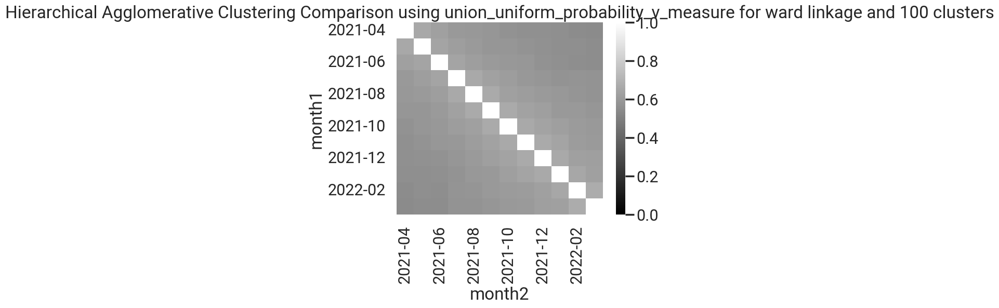

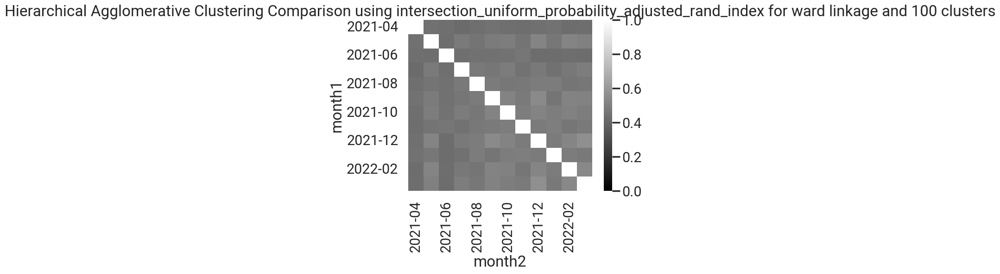

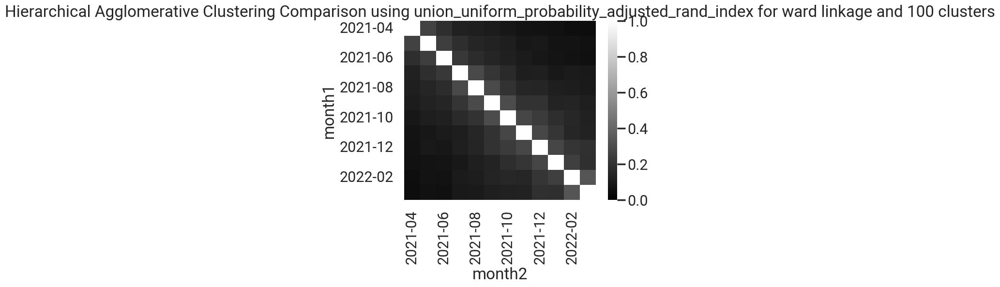

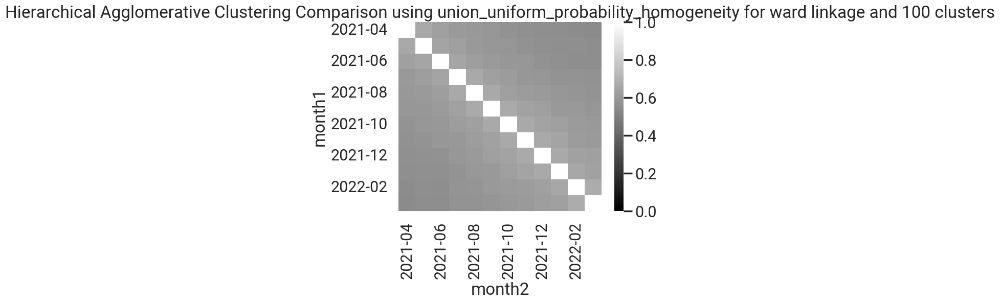

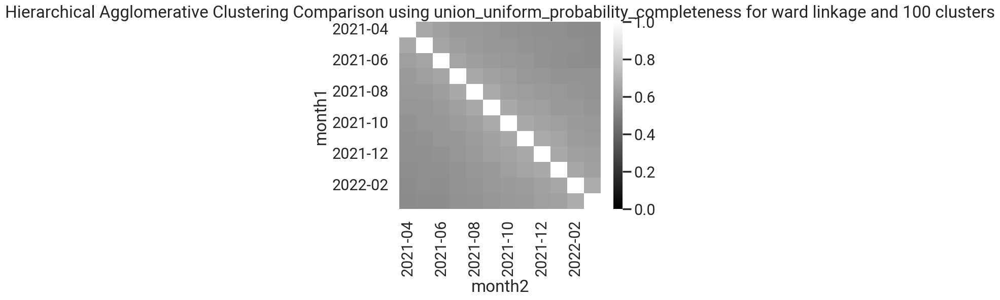

<Figure size 640x480 with 0 Axes>

In [20]:
for (l, n_clusters) in itertools.product(LINKAGE_TYPES, NUM_CLUSTERS):
    print("Linkage:", l, "Num Clusters:", n_clusters)
    for cluster_comp_metric in ALL_CLUSTER_COMP_METRICS:
        vmin = 0
        if "variation_of_information" in cluster_comp_metric:
            # Max of VOI is 2 log K when C_1 and C_2 both have at most K* clusters
            if "intersection" in cluster_comp_metric:
                vmax = 2*np.log2(n_clusters)
            elif "union" in cluster_comp_metric:
                vmax = 2*np.log2(n_clusters+1)
            
        else:
            vmax=1
        n_cluster_experiments = hac_cluster_comparison_df[(hac_cluster_comparison_df["linkage"] == l) & (hac_cluster_comparison_df["num_clusters"]==n_clusters)].copy()
        sns.heatmap(n_cluster_experiments.pivot_table(index="month1", columns="month2", values=cluster_comp_metric), vmin=vmin, vmax=vmax, cmap="gray").set_title(f"Hierarchical Agglomerative Clustering Comparison using {cluster_comp_metric} for {l} linkage and {n_clusters} clusters")
        plt.show()
        plt.clf()